# Proyek Analisis Data: [E-Commerce Public Dataset]
- **Nama:** Farhan Rasyad
- **Email:** farhanrasyad13@gmail.com
- **ID Dicoding:** input Username

## Menentukan Pertanyaan Bisnis

- Bagaimana tren pertumbuhan penjualan e-commerce dari waktu ke waktu berdasarkan jumlah pesanan dan total pendapatan?
- Kategori produk mana yang memiliki volume penjualan tertinggi dan terendah berdasarkan jumlah pesanan?
- Bagaimana distribusi rating pelanggan terhadap pesanan, dan kategori produk apa yang mendapat rating terbaik serta terburuk?
- Bagaimana hasil segmentasi pelanggan menggunakan metode RFM, dan bagaimana pola pembelian dari setiap segmen pelanggan?
- Bagaimana distribusi pelanggan berdasarkan lokasi dan apakah ada perbedaan pola pembelian di berbagai wilayah Brasil?
-  Bagaimana karakteristik persebaran geografis pembeli di platform E-Commerce ini?

## Import Semua Packages/Library yang Digunakan

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import zipfile
import datetime as dt
import os

# Library untuk visualisasi
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Library untuk segmentasi pelanggan (RFM)
from sklearn.preprocessing import MinMaxScaler


## Extract Zip Kedalam Bentuk CSV

In [ ]:
# Extract Zip Kedalam Bentuk CSV
with zipfile.ZipFile('/content/E-commerce-public-dataset.zip', 'r') as zip_ref:
    zip_ref.extractall('/content')


## Data Wrangling



### Gathering Data

---

### Customer_DF


In [ ]:
#Load customers tabel
dataset_path = '/content/E-Commerce Public Dataset'
customers_df = pd.read_csv(os.path.join(dataset_path, '/content/E-Commerce Public Dataset/customers_dataset.csv'))
customers_df

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,sao bernardo do campo,SP
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,1151,sao paulo,SP
3,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,8775,mogi das cruzes,SP
4,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,13056,campinas,SP
...,...,...,...,...,...
99436,17ddf5dd5d51696bb3d7c6291687be6f,1a29b476fee25c95fbafc67c5ac95cf8,3937,sao paulo,SP
99437,e7b71a9017aa05c9a7fd292d714858e8,d52a67c98be1cf6a5c84435bd38d095d,6764,taboao da serra,SP
99438,5e28dfe12db7fb50a4b2f691faecea5e,e9f50caf99f032f0bf3c55141f019d99,60115,fortaleza,CE
99439,56b18e2166679b8a959d72dd06da27f9,73c2643a0a458b49f58cea58833b192e,92120,canoas,RS


**Insight:**
- Jumlah pelanggan dan distribusinya di berbagai negara bagian di Brasil.  Hal ini akan membantu memahami konsentrasi pelanggan.

### Geolocation_DF

In [ ]:
#Load geolocation tabel
dataset_path = '/content/E-Commerce Public Dataset'
geolocation_df = pd.read_csv(os.path.join(dataset_path, '/content/E-Commerce Public Dataset/geolocation_dataset.csv'))
geolocation_df

,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state
0,1037,-23.545621,-46.639292,sao paulo,SP
1,1046,-23.546081,-46.644820,sao paulo,SP
2,1046,-23.546129,-46.642951,sao paulo,SP
3,1041,-23.544392,-46.639499,sao paulo,SP
4,1035,-23.541578,-46.641607,sao paulo,SP
...,...,...,...,...,...
1000158,99950,-28.068639,-52.010705,tapejara,RS
1000159,99900,-27.877125,-52.224882,getulio vargas,RS
1000160,99950,-28.071855,-52.014716,tapejara,RS
1000161,99980,-28.388932,-51.846871,david canabarro,RS


**Insight:**
 - Distribusi geografis pelanggan: Memahami sebaran pelanggan berdasarkan koordinat geografis (latitude dan longitude).  Ini bisa divisualisasikan sebagai peta untuk melihat konsentrasi pelanggan di berbagai wilayah.
 - Hubungan antara lokasi dan metrik lainnya:  Mencari korelasi antara lokasi pelanggan dengan metrik penjualan, seperti jumlah pesanan atau total pendapatan. Apakah ada wilayah tertentu yang berkontribusi lebih signifikan terhadap penjualan.

### Order Items_DF

In [ ]:
#Load order_items tabel
dataset_path = '/content/E-Commerce Public Dataset'
order_items_df = pd.read_csv(os.path.join(dataset_path, '/content/E-Commerce Public Dataset/order_items_dataset.csv'))
order_items_df

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.90,13.29
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.90,19.93
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:30,199.00,17.87
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,2018-08-15 10:10:18,12.99,12.79
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,2017-02-13 13:57:51,199.90,18.14
...,...,...,...,...,...,...,...
112645,fffc94f6ce00a00581880bf54a75a037,1,4aa6014eceb682077f9dc4bffebc05b0,b8bc237ba3788b23da09c0f1f3a3288c,2018-05-02 04:11:01,299.99,43.41
112646,fffcd46ef2263f404302a634eb57f7eb,1,32e07fd915822b0765e448c4dd74c828,f3c38ab652836d21de61fb8314b69182,2018-07-20 04:31:48,350.00,36.53
112647,fffce4705a9662cd70adb13d4a31832d,1,72a30483855e2eafc67aee5dc2560482,c3cfdc648177fdbbbb35635a37472c53,2017-10-30 17:14:25,99.90,16.95
112648,fffe18544ffabc95dfada21779c9644f,1,9c422a519119dcad7575db5af1ba540e,2b3e4a2a3ea8e01938cabda2a3e5cc79,2017-08-21 00:04:32,55.99,8.72


**Insight:**
- Distribusi harga produk: Memahami rentang harga produk yang dijual, harga rata-rata, harga minimum, dan maksimum.
- Frekuensi pembelian produk:  Identifikasi produk-produk yang sering dibeli dan yang jarang dibeli.

### Order Payment_DF

In [ ]:
#Load order_payments tabel
dataset_path = '/content/E-Commerce Public Dataset'
order_payments_df = pd.read_csv(os.path.join(dataset_path, '/content/E-Commerce Public Dataset/order_payments_dataset.csv'))
order_payments_df

,order_id,payment_sequential,payment_type,payment_installments,payment_value
0,b81ef226f3fe1789b1e8b2acac839d17,1,credit_card,8,99.33
1,a9810da82917af2d9aefd1278f1dcfa0,1,credit_card,1,24.39
2,25e8ea4e93396b6fa0d3dd708e76c1bd,1,credit_card,1,65.71
3,ba78997921bbcdc1373bb41e913ab953,1,credit_card,8,107.78
4,42fdf880ba16b47b59251dd489d4441a,1,credit_card,2,128.45
...,...,...,...,...,...
103881,0406037ad97740d563a178ecc7a2075c,1,boleto,1,363.31
103882,7b905861d7c825891d6347454ea7863f,1,credit_card,2,96.80
103883,32609bbb3dd69b3c066a6860554a77bf,1,credit_card,1,47.77
103884,b8b61059626efa996a60be9bb9320e10,1,credit_card,5,369.54


**Insight:**
- Distribusi metode pembayaran:  Melihat proporsi penggunaan berbagai metode pembayaran untuk mencari Metode pembayaran mana yang paling populer?

### Order reviews_DF

In [ ]:
#Load order_reviews tabel
dataset_path = '/content/E-Commerce Public Dataset'
order_reviews_df = pd.read_csv(os.path.join(dataset_path, '/content/E-Commerce Public Dataset/order_reviews_dataset.csv'))
order_reviews_df

,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
0,7bc2406110b926393aa56f80a40eba40,73fc7af87114b39712e6da79b0a377eb,4,NaN,NaN,2018-01-18 00:00:00,2018-01-18 21:46:59
1,80e641a11e56f04c1ad469d5645fdfde,a548910a1c6147796b98fdf73dbeba33,5,NaN,NaN,2018-03-10 00:00:00,2018-03-11 03:05:13
2,228ce5500dc1d8e020d8d1322874b6f0,f9e4b658b201a9f2ecdecbb34bed034b,5,NaN,NaN,2018-02-17 00:00:00,2018-02-18 14:36:24
3,e64fb393e7b32834bb789ff8bb30750e,658677c97b385a9be170737859d3511b,5,NaN,Recebi bem antes do prazo estipulado.,2017-04-21 00:00:00,2017-04-21 22:02:06
4,f7c4243c7fe1938f181bec41a392bdeb,8e6bfb81e283fa7e4f11123a3fb894f1,5,NaN,Parabéns lojas lannister adorei comprar pela I...,2018-03-01 00:00:00,2018-03-02 10:26:53
...,...,...,...,...,...,...,...
99219,574ed12dd733e5fa530cfd4bbf39d7c9,2a8c23fee101d4d5662fa670396eb8da,5,NaN,NaN,2018-07-07 00:00:00,2018-07-14 17:18:30
99220,f3897127253a9592a73be9bdfdf4ed7a,22ec9f0669f784db00fa86d035cf8602,5,NaN,NaN,2017-12-09 00:00:00,2017-12-11 20:06:42
99221,b3de70c89b1510c4cd3d0649fd302472,55d4004744368f5571d1f590031933e4,5,NaN,"Excelente mochila, entrega super rápida. Super...",2018-03-22 00:00:00,2018-03-23 09:10:43
99222,1adeb9d84d72fe4e337617733eb85149,7725825d039fc1f0ceb7635e3f7d9206,4,NaN,NaN,2018-07-01 00:00:00,2018-07-02 12:59:13


**Insight:**
- Distribusi rating pelanggan: Melihat seberapa banyak pelanggan memberikan rating tertentu (1-5 bintang).  Apakah mayoritas pelanggan memberikan rating positif atau negatif?
- Perbandingan rating antar kategori produk:  Melihat kategori produk mana yang mendapatkan rating terbaik dan terburuk dari pelanggan.

### Order_DF

In [ ]:
#Load orders tabel
dataset_path = '/content/E-Commerce Public Dataset'
order_df = pd.read_csv(os.path.join(dataset_path, '/content/E-Commerce Public Dataset/orders_dataset.csv'))
order_df

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15 00:00:00
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26 00:00:00
...,...,...,...,...,...,...,...,...
99436,9c5dedf39a927c1b2549525ed64a053c,39bd1228ee8140590ac3aca26f2dfe00,delivered,2017-03-09 09:54:05,2017-03-09 09:54:05,2017-03-10 11:18:03,2017-03-17 15:08:01,2017-03-28 00:00:00
99437,63943bddc261676b46f01ca7ac2f7bd8,1fca14ff2861355f6e5f14306ff977a7,delivered,2018-02-06 12:58:58,2018-02-06 13:10:37,2018-02-07 23:22:42,2018-02-28 17:37:56,2018-03-02 00:00:00
99438,83c1379a015df1e13d02aae0204711ab,1aa71eb042121263aafbe80c1b562c9c,delivered,2017-08-27 14:46:43,2017-08-27 15:04:16,2017-08-28 20:52:26,2017-09-21 11:24:17,2017-09-27 00:00:00
99439,11c177c8e97725db2631073c19f07b62,b331b74b18dc79bcdf6532d51e1637c1,delivered,2018-01-08 21:28:27,2018-01-08 21:36:21,2018-01-12 15:35:03,2018-01-25 23:32:54,2018-02-15 00:00:00


**Insight:**
- Tren order dari waktu ke waktu: Melihat pola pembelian pelanggan (misalnya, peningkatan atau penurunan order selama periode tertentu)

### Product Category Name_DF

In [ ]:
#Load product_category_name_translation tabel
dataset_path = '/content/E-Commerce Public Dataset'
product_category_name_df = pd.read_csv(os.path.join(dataset_path, 'product_category_name_translation.csv'))
product_category_name_df

,product_category_name,product_category_name_english
0,beleza_saude,health_beauty
1,informatica_acessorios,computers_accessories
2,automotivo,auto
3,cama_mesa_banho,bed_bath_table
4,moveis_decoracao,furniture_decor
...,...,...
66,flores,flowers
67,artes_e_artesanato,arts_and_craftmanship
68,fraldas_higiene,diapers_and_hygiene
69,fashion_roupa_infanto_juvenil,fashion_childrens_clothes


**Insight:**
- Distribusi kategori produk: Melihat sebaran jumlah produk dalam setiap kategori. Kategori mana yang paling banyak produknya, dan kategori mana yang paling sedikit.

### Products_DF

In [ ]:
#Load products tabel
dataset_path = '/content/E-Commerce Public Dataset'
products_df = pd.read_csv(os.path.join(dataset_path, '/content/E-Commerce Public Dataset/products_dataset.csv'))
products_df

,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
0,1e9e8ef04dbcff4541ed26657ea517e5,perfumaria,40.0,287.0,1.0,225.0,16.0,10.0,14.0
1,3aa071139cb16b67ca9e5dea641aaa2f,artes,44.0,276.0,1.0,1000.0,30.0,18.0,20.0
2,96bd76ec8810374ed1b65e291975717f,esporte_lazer,46.0,250.0,1.0,154.0,18.0,9.0,15.0
3,cef67bcfe19066a932b7673e239eb23d,bebes,27.0,261.0,1.0,371.0,26.0,4.0,26.0
4,9dc1a7de274444849c219cff195d0b71,utilidades_domesticas,37.0,402.0,4.0,625.0,20.0,17.0,13.0
...,...,...,...,...,...,...,...,...,...
32946,a0b7d5a992ccda646f2d34e418fff5a0,moveis_decoracao,45.0,67.0,2.0,12300.0,40.0,40.0,40.0
32947,bf4538d88321d0fd4412a93c974510e6,construcao_ferramentas_iluminacao,41.0,971.0,1.0,1700.0,16.0,19.0,16.0
32948,9a7c6041fa9592d9d9ef6cfe62a71f8c,cama_mesa_banho,50.0,799.0,1.0,1400.0,27.0,7.0,27.0
32949,83808703fc0706a22e264b9d75f04a2e,informatica_acessorios,60.0,156.0,2.0,700.0,31.0,13.0,20.0


**Insight:**
- Jumlah produk yang tersedia di setiap kategori: Melihat sebaran jumlah produk dalam setiap kategori. Kategori mana yang memiliki jumlah produk terbanyak dan terkecil?  Ini membantu dalam memahami popularitas kategori produk.

### Seller_DF

In [ ]:
#Load sellers tabel
dataset_path = '/content/E-Commerce Public Dataset'
sellers_df = pd.read_csv(os.path.join(dataset_path, '/content/E-Commerce Public Dataset/sellers_dataset.csv'))
sellers_df

,seller_id,seller_zip_code_prefix,seller_city,seller_state
0,3442f8959a84dea7ee197c632cb2df15,13023,campinas,SP
1,d1b65fc7debc3361ea86b5f14c68d2e2,13844,mogi guacu,SP
2,ce3ad9de960102d0677a81f5d0bb7b2d,20031,rio de janeiro,RJ
3,c0f3eea2e14555b6faeea3dd58c1b1c3,4195,sao paulo,SP
4,51a04a8a6bdcb23deccc82b0b80742cf,12914,braganca paulista,SP
...,...,...,...,...
3090,98dddbc4601dd4443ca174359b237166,87111,sarandi,PR
3091,f8201cab383e484733266d1906e2fdfa,88137,palhoca,SC
3092,74871d19219c7d518d0090283e03c137,4650,sao paulo,SP
3093,e603cf3fec55f8697c9059638d6c8eb5,96080,pelotas,RS


**Insight:**
- Distribusi penjual berdasarkan lokasi geografis: Identifikasi konsentrasi penjual di berbagai wilayah Brasil.
- Jumlah produk yang dijual setiap penjual:  Analisis penjual mana yang menawarkan paling banyak produk.
- Kinerja penjual berdasarkan metrik: Evaluasi performa penjual berdasarkan jumlah penjualan, rating, dan ulasan pelanggan.

### Assessing Data

---

### Customer_DF


In [ ]:
customers_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99441 entries, 0 to 99440
Data columns (total 5 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   customer_id               99441 non-null  object
 1   customer_unique_id        99441 non-null  object
 2   customer_zip_code_prefix  99441 non-null  int64 
 3   customer_city             99441 non-null  object
 4   customer_state            99441 non-null  object
dtypes: int64(1), object(4)
memory usage: 3.8+ MB


Dapat dilihat bahwa data memiliki nilai yang sama semuanya yaitu sebanyak  99441 data yang menandakan bahwa tidak adanya missing value

#### Missing value

In [ ]:
customers_df.isnull().sum()

,0
customer_id,0
customer_unique_id,0
customer_zip_code_prefix,0
customer_city,0
customer_state,0


customers_df tidak memiliki missing value atau Jumlah missing value = 0

#### Duplicate data

In [ ]:
print("Jumlah duplikasi: ", customers_df.duplicated().sum())

Jumlah duplikasi:  0


tidak ada data duplikasi pada customers_df atau nilai duplikasi pada customer_df = 0

#### Checking statistical values

In [ ]:
customers_df.describe()

,customer_zip_code_prefix
count,99441.000000
mean,35137.474583
std,29797.938996
min,1003.000000
25%,11347.000000
50%,24416.000000
75%,58900.000000
max,99990.000000


tidak terdapat keanehan pada pengecekan nilai statistik untuk customer_df

### Geolocation_DF

In [ ]:
geolocation_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000163 entries, 0 to 1000162
Data columns (total 5 columns):
 #   Column                       Non-Null Count    Dtype  
---  ------                       --------------    -----  
 0   geolocation_zip_code_prefix  1000163 non-null  int64  
 1   geolocation_lat              1000163 non-null  float64
 2   geolocation_lng              1000163 non-null  float64
 3   geolocation_city             1000163 non-null  object 
 4   geolocation_state            1000163 non-null  object 
dtypes: float64(2), int64(1), object(2)
memory usage: 38.2+ MB


Dapat dilihat bahwa semua nilai data sama dan tidak ada yang kosong serta untuk tipe data pun tidak ada yang memiliki kesalahan

#### Missing Value

In [ ]:
geolocation_df.isnull().sum()

,0
geolocation_zip_code_prefix,0
geolocation_lat,0
geolocation_lng,0
geolocation_city,0
geolocation_state,0


Tidak terdapat missing value pada Geolocation_df atau jumlah Missing value = 0

#### Duplicate Data

In [ ]:
print("Jumlah duplikasi: ",geolocation_df.duplicated().sum())

Jumlah duplikasi:  261831


Terdapat Duplikasi data pada Geolocation_df sebanyak 261831 data

#### Checking statistical values

In [ ]:
geolocation_df.describe()

,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng
count,1.000163e+06,1.000163e+06,1.000163e+06
mean,3.657417e+04,-2.117615e+01,-4.639054e+01
std,3.054934e+04,5.715866e+00,4.269748e+00
min,1.001000e+03,-3.660537e+01,-1.014668e+02
25%,1.107500e+04,-2.360355e+01,-4.857317e+01
50%,2.653000e+04,-2.291938e+01,-4.663788e+01
75%,6.350400e+04,-1.997962e+01,-4.376771e+01
max,9.999000e+04,4.506593e+01,1.211054e+02


Saat dilakukan pengecekan statistik tidak ditemukan keanehan pada geolocation_df

### Order Items_DF

In [ ]:
order_items_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 112650 entries, 0 to 112649
Data columns (total 7 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   order_id             112650 non-null  object 
 1   order_item_id        112650 non-null  int64  
 2   product_id           112650 non-null  object 
 3   seller_id            112650 non-null  object 
 4   shipping_limit_date  112650 non-null  object 
 5   price                112650 non-null  float64
 6   freight_value        112650 non-null  float64
dtypes: float64(2), int64(1), object(4)
memory usage: 6.0+ MB


Dapat dilihat untuk semua jumlah data memiliki nilai yang sama yang menandakan tidak adanya missing value namun terjadi kesalahan pada tipe data di kolom  **shipping_limit_date** yang seharusnya bertipe data datetime

#### Missing Value

In [ ]:
order_items_df.isnull().sum()

,0
order_id,0
order_item_id,0
product_id,0
seller_id,0
shipping_limit_date,0
price,0
freight_value,0


tidak ditemukan adanya missing value pada order_items_df atau jumlah missing value pada order_items_df sebanyak 0

#### Duplicate Data

In [ ]:
print("Jumlah duplikasi: ",order_items_df.duplicated().sum())

Jumlah duplikasi:  0


tidak ditemukan adanya duplikasi data pada order_items_df

#### Checking statistical values

In [ ]:
order_items_df.describe()

,order_item_id,price,freight_value
count,112650.000000,112650.000000,112650.000000
mean,1.197834,120.653739,19.990320
std,0.705124,183.633928,15.806405
min,1.000000,0.850000,0.000000
25%,1.000000,39.900000,13.080000
50%,1.000000,74.990000,16.260000
75%,1.000000,134.900000,21.150000
max,21.000000,6735.000000,409.680000


Tidak ditemukan adanya keanehan pada saat pengecekan statistik pada order_items_df

### Order Payment_DF

In [ ]:
order_payments_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 103886 entries, 0 to 103885
Data columns (total 5 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   order_id              103886 non-null  object 
 1   payment_sequential    103886 non-null  int64  
 2   payment_type          103886 non-null  object 
 3   payment_installments  103886 non-null  int64  
 4   payment_value         103886 non-null  float64
dtypes: float64(1), int64(2), object(2)
memory usage: 4.0+ MB


Dapat dilihat bahwa jumlah data semuanya sama yang menandakan bahwa tidak adanya missing value pada order_payments_df

#### Missing Value

In [ ]:
order_payments_df.isnull().sum()

,0
order_id,0
payment_sequential,0
payment_type,0
payment_installments,0
payment_value,0


Tidak terdapat missing value pada order_payments_df atau jumlah missing value sebanyak 0

#### Duplicate Data

In [ ]:
print("Jumlah duplikasi: ", order_payments_df.duplicated().sum())

Jumlah duplikasi:  0


Tidak terdapat duplikasi data pada order_payments_df atau jumlah duplikasi data sebanyak 0

#### Checking statistical values

In [ ]:
order_payments_df.describe()

,payment_sequential,payment_installments,payment_value
count,103886.000000,103886.000000,103886.000000
mean,1.092679,2.853349,154.100380
std,0.706584,2.687051,217.494064
min,1.000000,0.000000,0.000000
25%,1.000000,1.000000,56.790000
50%,1.000000,1.000000,100.000000
75%,1.000000,4.000000,171.837500
max,29.000000,24.000000,13664.080000


Tidak ditemukan adanya keanehan pada saat pengecekan statistik pada order_payments_df

### Order reviews_DF

In [ ]:
order_reviews_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99224 entries, 0 to 99223
Data columns (total 7 columns):
 #   Column                   Non-Null Count  Dtype 
---  ------                   --------------  ----- 
 0   review_id                99224 non-null  object
 1   order_id                 99224 non-null  object
 2   review_score             99224 non-null  int64 
 3   review_comment_title     11568 non-null  object
 4   review_comment_message   40977 non-null  object
 5   review_creation_date     99224 non-null  object
 6   review_answer_timestamp  99224 non-null  object
dtypes: int64(1), object(6)
memory usage: 5.3+ MB


Terdapat jumlah data yang tidak sama di beberapa kolom yang menandakan adanya missing value pada kolom tersebut dan juga terdapat kesalahan tipe data pada kolom **review_creation_date** dan **review_answer_timestamp** yang seharusnya bertipe data datetime

#### Missing Value

In [ ]:
order_reviews_df.isnull().sum()

,0
review_id,0
order_id,0
review_score,0
review_comment_title,87656
review_comment_message,58247
review_creation_date,0
review_answer_timestamp,0


Ditemukan adanya missing value pada kolom **review_comment_title** sebanyak 87656 dan juga pada kolom **review_comment_message** sebanyak 58247, ini mungkin terjadi saat customer membeli suatu produk namun dia tidak menuliskan judul pada komentarnya dan juga ada customer yang memang tidak menuliskan komentarnya

#### Duplicate Data

In [ ]:
print("Jumlah duplikasi: ", order_reviews_df.duplicated().sum())

Jumlah duplikasi:  0


Tidak terdapat duplikasi data pada order_reviews_df

#### Checking statistical values

In [ ]:
order_reviews_df.describe()

,review_score
count,99224.000000
mean,4.086421
std,1.347579
min,1.000000
25%,4.000000
50%,5.000000
75%,5.000000
max,5.000000


Tidak ada keanehan pada pengecekan statistik untuk order_reviews_df

### Order_DF

In [ ]:
order_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99441 entries, 0 to 99440
Data columns (total 8 columns):
 #   Column                         Non-Null Count  Dtype 
---  ------                         --------------  ----- 
 0   order_id                       99441 non-null  object
 1   customer_id                    99441 non-null  object
 2   order_status                   99441 non-null  object
 3   order_purchase_timestamp       99441 non-null  object
 4   order_approved_at              99281 non-null  object
 5   order_delivered_carrier_date   97658 non-null  object
 6   order_delivered_customer_date  96476 non-null  object
 7   order_estimated_delivery_date  99441 non-null  object
dtypes: object(8)
memory usage: 6.1+ MB


Pada beberapa kolom terdapat jumlah data yang tidak sama yang menandakan adanya missing value pada kolom tersebut dan juga terdapat kesalahan tipe data pada kolom  **order_purchase_timestamp **,  **order_approved_at**, **order_delivered_carrier_date **, **order_delivered_customer_date**,   **order_estimated_delivery_date**, yang seaharusnya bertipe data datetime

#### Missing Value

In [ ]:
order_df.isnull().sum()

,0
order_id,0
customer_id,0
order_status,0
order_purchase_timestamp,0
order_approved_at,160
order_delivered_carrier_date,1783
order_delivered_customer_date,2965
order_estimated_delivery_date,0


Terdapat Missing Value pada Kolom **order_approved_at** sebanyak 160, **order_delivered_carrier_date** sebanyak 1783, **order_delivered_customer_date** sebanyak 2963

In [ ]:
print("Jumlah duplikasi: ", order_df.duplicated().sum())

Jumlah duplikasi:  0


Tidak ditemukan adanya duplikasi data pada order_df

#### Checking statistical values

In [ ]:
order_df.describe()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
count,99441,99441,99441,99441,99281,97658,96476,99441
unique,99441,99441,8,98875,90733,81018,95664,459
top,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2018-04-11 10:48:14,2018-02-27 04:31:10,2018-05-09 15:48:00,2018-05-08 23:38:46,2017-12-20 00:00:00
freq,1,1,96478,3,9,47,3,522


Tidak terdapat keanehan pada saat pengecekan statistik pada order_df

### Product Category Name_DF

In [ ]:
product_category_name_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 71 entries, 0 to 70
Data columns (total 2 columns):
 #   Column                         Non-Null Count  Dtype 
---  ------                         --------------  ----- 
 0   product_category_name          71 non-null     object
 1   product_category_name_english  71 non-null     object
dtypes: object(2)
memory usage: 1.2+ KB


Dapat dilihat bahwa jumlah data dan juga tipe data tidak memiliki kesalahan

#### Missing Value

In [ ]:
product_category_name_df.isnull().sum()

,0
product_category_name,0
product_category_name_english,0


Tidak terdapat Missing Value pada product_category_name atau jumlah missing value = 0

#### Duplicate Data

In [ ]:
print("Jumlah duplikasi: ", product_category_name_df.duplicated().sum())

Jumlah duplikasi:  0


Tidak terdapat duplikasi data pada product_category_name

#### Checking statistical values

In [ ]:
product_category_name_df.describe()

,product_category_name,product_category_name_english
count,71,71
unique,71,71
top,beleza_saude,health_beauty
freq,1,1


Dari hasil pengecekan statistik pada product_category_name_df tidak ditemukan adanya keanehan

### Products_DF

In [ ]:
products_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32951 entries, 0 to 32950
Data columns (total 9 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   product_id                  32951 non-null  object 
 1   product_category_name       32341 non-null  object 
 2   product_name_lenght         32341 non-null  float64
 3   product_description_lenght  32341 non-null  float64
 4   product_photos_qty          32341 non-null  float64
 5   product_weight_g            32949 non-null  float64
 6   product_length_cm           32949 non-null  float64
 7   product_height_cm           32949 non-null  float64
 8   product_width_cm            32949 non-null  float64
dtypes: float64(7), object(2)
memory usage: 2.3+ MB


Terdapat jumlah data yang tidak sama di beberapa kolom yang menandakan adanya missing value pada kolom tersebut dan juga tidak ada kesalahan pada tipe data

#### Missing Value

In [ ]:
products_df.isnull().sum()

,0
product_id,0
product_category_name,610
product_name_lenght,610
product_description_lenght,610
product_photos_qty,610
product_weight_g,2
product_length_cm,2
product_height_cm,2
product_width_cm,2


Terdapat Missing value di setiap kolom kecuali pada kolom product_id

#### Duplicate Data

In [ ]:
print("Jumlah duplikasi: ", products_df.duplicated().sum())

Jumlah duplikasi:  0


Tidak dtemukan adanya duplikasi data pada products_df

#### Checking statistical values

In [ ]:
products_df.describe()

,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
count,32341.000000,32341.000000,32341.000000,32949.000000,32949.000000,32949.000000,32949.000000
mean,48.476949,771.495285,2.188986,2276.472488,30.815078,16.937661,23.196728
std,10.245741,635.115225,1.736766,4282.038731,16.914458,13.637554,12.079047
min,5.000000,4.000000,1.000000,0.000000,7.000000,2.000000,6.000000
25%,42.000000,339.000000,1.000000,300.000000,18.000000,8.000000,15.000000
50%,51.000000,595.000000,1.000000,700.000000,25.000000,13.000000,20.000000
75%,57.000000,972.000000,3.000000,1900.000000,38.000000,21.000000,30.000000
max,76.000000,3992.000000,20.000000,40425.000000,105.000000,105.000000,118.000000


Hasil pengecekan statistik pada products_df tidak ditemukan adanya keanehan

### Seller_DF

In [ ]:
sellers_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3095 entries, 0 to 3094
Data columns (total 4 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   seller_id               3095 non-null   object
 1   seller_zip_code_prefix  3095 non-null   int64 
 2   seller_city             3095 non-null   object
 3   seller_state            3095 non-null   object
dtypes: int64(1), object(3)
memory usage: 96.8+ KB


Dapat dilihat bahwa tipe data dan juga jumlah datanya tidak ada yang memiliki kesalahan

#### Missing Value

In [ ]:
sellers_df.isnull().sum()

,0
seller_id,0
seller_zip_code_prefix,0
seller_city,0
seller_state,0


Tidak ditemukan adanya missing value pada sellers_df atau jumlah missing value sebanyak 0

#### Duplicate Data

In [ ]:
print("Jumlah duplikasi: ", sellers_df.duplicated().sum())

Jumlah duplikasi:  0


Tidak ditemukan adanya duplikasi data pada sellers_df

#### Checking statistical values

In [ ]:
sellers_df.describe()

,seller_zip_code_prefix
count,3095.000000
mean,32291.059451
std,32713.453830
min,1001.000000
25%,7093.500000
50%,14940.000000
75%,64552.500000
max,99730.000000


Tidak ditemukanya keanehan pada saat pengecekan statistik pada sellers_df

### Cleaning Data

---

### Missing Value

#### Order Reviews

In [ ]:
print(order_reviews_df[['review_comment_title', 'review_comment_message']].isnull().sum())

review_comment_title      87656
review_comment_message    58247
dtype: int64


Dapat dilihat bahwa kolom tersebut memiliki missing value yang cukup banyak

In [ ]:
missing_title = order_reviews_df[order_reviews_df.review_comment_title.isna()]

missing_message = order_reviews_df[order_reviews_df.review_comment_message.isna()]

print("Missing Values in review_comment_title:\n", missing_title)
print("\nMissing Values in review_comment_message:\n", missing_message)


Missing Values in review_comment_title:
                               review_id                          order_id  \
0      7bc2406110b926393aa56f80a40eba40  73fc7af87114b39712e6da79b0a377eb   
1      80e641a11e56f04c1ad469d5645fdfde  a548910a1c6147796b98fdf73dbeba33   
2      228ce5500dc1d8e020d8d1322874b6f0  f9e4b658b201a9f2ecdecbb34bed034b   
3      e64fb393e7b32834bb789ff8bb30750e  658677c97b385a9be170737859d3511b   
4      f7c4243c7fe1938f181bec41a392bdeb  8e6bfb81e283fa7e4f11123a3fb894f1   
...                                 ...                               ...   
99219  574ed12dd733e5fa530cfd4bbf39d7c9  2a8c23fee101d4d5662fa670396eb8da   
99220  f3897127253a9592a73be9bdfdf4ed7a  22ec9f0669f784db00fa86d035cf8602   
99221  b3de70c89b1510c4cd3d0649fd302472  55d4004744368f5571d1f590031933e4   
99222  1adeb9d84d72fe4e337617733eb85149  7725825d039fc1f0ceb7635e3f7d9206   
99223  efe49f1d6f951dd88b51e6ccd4cc548f  90531360ecb1eec2a1fbb265a0db0508   

       review_score review_comment

Kode diatas digunakan untuk melihat letak missing value berada dan benar bahwa missing value berada pada kolom **review_comment_title** dan **review_comment_message** dengan nilai NaN

In [ ]:
print(order_reviews_df['review_comment_title'].value_counts())
print(order_reviews_df['review_comment_message'].value_counts())


review_comment_title
Recomendo                    423
recomendo                    345
Bom                          293
super recomendo              270
Excelente                    248
                            ... 
Luminaria sobrepor led 18      1
Não recebi.                    1
produto com lacre violado      1
Atraso Entrega                 1
Foto enganosa                  1
Name: count, Length: 4527, dtype: int64
review_comment_message
Muito bom                                                                                                                                                                                              230
Bom                                                                                                                                                                                                    189
muito bom                                                                                                                                          

Kita dapat mengisi nilai yang hilang pada kedua kolom tersebut dengan "No Tittle" dan "No reviews" menggunakan metode fillna, namun kedua kolom tersebut tidak terlalu berpengaruh karena saya tidak akan melakukan analisis sentimen dengan kata lain sebenernya jika missing value tidak di handle itu tidak menjadi masalah, namun disini saya hanya akan mengambil data review scorenya saja

In [ ]:
order_reviews_df['review_comment_title'].fillna('no title', inplace=True)

<ipython-input-52-7cdb611a40aa>:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  order_reviews_df['review_comment_title'].fillna('no title', inplace=True)


Melakukan metode fillna pada **review_comment_title** untuk mengisi missing valuenya dengan kata "no tittle"

In [ ]:
order_reviews_df['review_comment_message'].fillna('no reviews', inplace=True)

<ipython-input-53-a65f970a55da>:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  order_reviews_df['review_comment_message'].fillna('no reviews', inplace=True)


Melakukan metode fillna pada **review_comment_message** untuk mengisi missing valuenya dengan kata "no reviews"

In [ ]:
print(order_reviews_df[['review_comment_title', 'review_comment_message']].isnull().sum())

review_comment_title      0
review_comment_message    0
dtype: int64


Dapat dilihat bahwa missing value pada kolom tersebut sudah tidak ditemukan lagi

### Data Duplicate

Disini ditemukan data duplikat pada geolocation_df dan kolom yang terdapat duplikat ada di kolom **geolocation_city** dan  **geolocation_state** karena value tertingginya itu ada di sao paulo maka saya memutuskan untuk tidak melakukan handling duplkat pada dataset tersebut

### Data type

#### Order Items

In [ ]:
order_items_df['shipping_limit_date'] = pd.to_datetime(order_items_df['shipping_limit_date'])

Mengubah tipedata pada kolom shipping_limit_date pada order_items_df menjadi datetime

In [ ]:
order_items_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 112650 entries, 0 to 112649
Data columns (total 7 columns):
 #   Column               Non-Null Count   Dtype         
---  ------               --------------   -----         
 0   order_id             112650 non-null  object        
 1   order_item_id        112650 non-null  int64         
 2   product_id           112650 non-null  object        
 3   seller_id            112650 non-null  object        
 4   shipping_limit_date  112650 non-null  datetime64[ns]
 5   price                112650 non-null  float64       
 6   freight_value        112650 non-null  float64       
dtypes: datetime64[ns](1), float64(2), int64(1), object(3)
memory usage: 6.0+ MB


Melakukan pengecekan apakah tipedata sudah berubah dan ternyata tipedata **shipping_limit_date** sudah berubah menjadi datetime

#### Order reviews

In [ ]:
order_reviews_df[['review_creation_date', 'review_answer_timestamp']] = order_reviews_df[
    ['review_creation_date', 'review_answer_timestamp']
].apply(pd.to_datetime)


Mengubah tipedata pada kolom **review_creation_date** dan **review_answer_timestamp** menjadi datetime

In [ ]:
order_reviews_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99224 entries, 0 to 99223
Data columns (total 7 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   review_id                99224 non-null  object        
 1   order_id                 99224 non-null  object        
 2   review_score             99224 non-null  int64         
 3   review_comment_title     99224 non-null  object        
 4   review_comment_message   99224 non-null  object        
 5   review_creation_date     99224 non-null  datetime64[ns]
 6   review_answer_timestamp  99224 non-null  datetime64[ns]
dtypes: datetime64[ns](2), int64(1), object(4)
memory usage: 5.3+ MB


Melakukan pengecekan apakah tipe data pada kolom tersebut sudah berubah dan ternyata tipe data pada kolom tersebut sudah berubah menjadi datetime

#### Order

In [ ]:
datetime_order = [
    "order_purchase_timestamp",
    "order_approved_at",
    "order_delivered_carrier_date",
    "order_delivered_customer_date",
    "order_estimated_delivery_date"
]

# Mengonversi setiap kolom dalam daftar ke format datetime
for column in datetime_order :
    order_df[column] = pd.to_datetime(order_df[column], errors='coerce', format='%Y-%m-%d %H:%M:%S')

    # Menampilkan informasi setelah konversi
    print(f"Kolom '{column}' telah dikonversi ke datetime dengan {order_df[column].isna().sum()} nilai NaT.")

Kolom 'order_purchase_timestamp' telah dikonversi ke datetime dengan 0 nilai NaT.
Kolom 'order_approved_at' telah dikonversi ke datetime dengan 160 nilai NaT.
Kolom 'order_delivered_carrier_date' telah dikonversi ke datetime dengan 1783 nilai NaT.
Kolom 'order_delivered_customer_date' telah dikonversi ke datetime dengan 2965 nilai NaT.
Kolom 'order_estimated_delivery_date' telah dikonversi ke datetime dengan 0 nilai NaT.


Mengonversi tipedata pada kolom kolom tersebut menjadi tipe data datetime

In [ ]:
order_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99441 entries, 0 to 99440
Data columns (total 8 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   order_id                       99441 non-null  object        
 1   customer_id                    99441 non-null  object        
 2   order_status                   99441 non-null  object        
 3   order_purchase_timestamp       99441 non-null  datetime64[ns]
 4   order_approved_at              99281 non-null  datetime64[ns]
 5   order_delivered_carrier_date   97658 non-null  datetime64[ns]
 6   order_delivered_customer_date  96476 non-null  datetime64[ns]
 7   order_estimated_delivery_date  99441 non-null  datetime64[ns]
dtypes: datetime64[ns](5), object(3)
memory usage: 6.1+ MB


Melakukan pengecekan apakah tipedata sudah berubah menjadi datetime pada kolom kolom yang dipilih dan ternyata tipedata sudah berubah menjadi datetime pada kolom kolom terpilih

### Exploratory Data Analysis (EDA)

---

### 1. Mencoba Melihat Jumlah Pembeli Terbanyak Berdasarkan bulan

In [ ]:
customers_df.describe(include="all")

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
count,99441,99441,99441.000000,99441,99441
unique,99441,96096,NaN,4119,27
top,06b8999e2fba1a1fbc88172c00ba8bc7,8d50f5eadf50201ccdcedfb9e2ac8455,NaN,sao paulo,SP
freq,1,17,NaN,15540,41746
mean,NaN,NaN,35137.474583,NaN,NaN
std,NaN,NaN,29797.938996,NaN,NaN
min,NaN,NaN,1003.000000,NaN,NaN
25%,NaN,NaN,11347.000000,NaN,NaN
50%,NaN,NaN,24416.000000,NaN,NaN
75%,NaN,NaN,58900.000000,NaN,NaN


Melakukan pengecekan menggunakan metode describe pada table customer

In [ ]:
customers_df.sample(5)

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
91014,63acf8de888f1bd3574cf7432ff0312d,6422bfe69991c1b3c75662e99a9f51e2,50791,recife,PE
33834,c837ceab73293b8742bf6c2e65e9191b,6254ab442499b6440e4a34ca524ff5e6,63122,crato,CE
35803,a20addfde19c0adbe45c295c7a2c996d,4bd71dda98d3a4573ef699a586976d65,12460,campos do jordao,SP
54583,e12442fd928531ac63187816f2e6e860,8e4e52c1121ceac09bb47f0cd51b4447,64208,parnaiba,PI
97243,a7c44bb8aa9c0737ed95216600460b84,6d1d129c5d436ab5291628643ca34343,59115,natal,RN


Melakukan pengecekan pada table Customer dengan menampilkan 5 data sampel

In [ ]:
top_buyers_per_month = order_df.groupby(order_df['order_purchase_timestamp'].dt.to_period('M'))['customer_id'].nunique().sort_values(ascending=False).reset_index()
print(top_buyers_per_month.head())

  order_purchase_timestamp  customer_id
0                  2017-11         7544
1                  2018-01         7269
2                  2018-03         7211
3                  2018-04         6939
4                  2018-05         6873


Melakukan pengecekan terhadap table Customer untuk melihat Total pembeli terbanyak berada pada bulan berapa dan pembeli terbanyak pada bulan 11 tahun 2017

### 2. Mencoba Melihat Jumlah Pembeli Berdasarkan City dan State

In [ ]:
customers_df.describe(include="all")

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
count,99441,99441,99441.000000,99441,99441
unique,99441,96096,NaN,4119,27
top,06b8999e2fba1a1fbc88172c00ba8bc7,8d50f5eadf50201ccdcedfb9e2ac8455,NaN,sao paulo,SP
freq,1,17,NaN,15540,41746
mean,NaN,NaN,35137.474583,NaN,NaN
std,NaN,NaN,29797.938996,NaN,NaN
min,NaN,NaN,1003.000000,NaN,NaN
25%,NaN,NaN,11347.000000,NaN,NaN
50%,NaN,NaN,24416.000000,NaN,NaN
75%,NaN,NaN,58900.000000,NaN,NaN


Melakukan pengecekan dengan metode describe pada table Customer

In [ ]:
customers_df.sample(5)

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
76933,319481c968caf99d5daa782270571d51,e9feb443162e083e5affc833800cb8c1,55400,catende,PE
4941,ed428ee145a75b8846cfbb94fab90477,ebbea8abf46e0acafc8a1260daa25b15,13710,tambau,SP
33763,ed7814adc6ccc7f303edd1c2bf9fc0e5,2fd9aad8ae73e1ef73a09564b72c41c9,20260,rio de janeiro,RJ
73184,ac9333a0622593a2af3c26cbec36576c,78b47e917e6732e91b9fd5e23205b830,18145,sao roque,SP
7418,369ec69ef76c47e51980b88a5740dc1b,1acfddcc366d45e07b84eedc46282cdc,48990,andorinha,BA


Menampilkan 5 data sampel pada table Customer

In [ ]:
customers_df.groupby(by="customer_city").customer_id.nunique().sort_values(ascending=False)

,customer_id
customer_city,
sao paulo,15540
rio de janeiro,6882
belo horizonte,2773
brasilia,2131
curitiba,1521
...,...
ibiara,1
rio espera,1
rio dos indios,1


Melakukan pengecekan untuk melihat di kota mana yang paling banyak pembeli nya dan pembeli terbanyak berada di kota **sao paulo**

In [ ]:
customers_df.groupby(by="customer_state").customer_id.nunique().sort_values(ascending=False)

,customer_id
customer_state,
SP,41746
RJ,12852
MG,11635
RS,5466
PR,5045
SC,3637
BA,3380
DF,2140
ES,2033


Melakukan pengecekan di state mana yang memiliki customer terbanyak dan state yang memiliki customer terbanyak berada di **SP**

### 3. Mencoba Melihat Jumlah Pembeli yang Active dan Non Active

In [ ]:
active_customers = order_df['customer_id'].nunique()
total_customers = customers_df['customer_id'].nunique()
non_active_customers = total_customers - active_customers
customer_activity = pd.DataFrame({"Status": ["Active", "Non-Active"], "Count": [active_customers, non_active_customers]})
print(customer_activity)


       Status  Count
0      Active  99441
1  Non-Active      0


Mencoba melihat berapa banyak pembeli yang aktif dan non aktif dan dapat dilihat bahwa semua pembeli aktif sebanyak **99441** dan tidak ada yang non aktif

In [ ]:
active_customer_list = order_df['customer_id'].value_counts().head(5).reset_index()
active_customer_list.columns = ['customer_id', 'order_count']
print(active_customer_list)

                        customer_id  order_count
0  9ef432eb6251297304e76186b10a928d            1
1  413f7e58270a32396af030a075b924be            1
2  eb4350b67a0264c67e5e06a038e4afbb            1
3  622b07d262d545d16efbd4363a89cb91            1
4  c701fbfa77791abd05eef9eacf7ea7a8            1


### 4. Mencoba Melihat Payment Method Terpopuler

In [ ]:
order_payments_df.describe(include="all")

,order_id,payment_sequential,payment_type,payment_installments,payment_value
count,103886,103886.000000,103886,103886.000000,103886.000000
unique,99440,NaN,5,NaN,NaN
top,fa65dad1b0e818e3ccc5cb0e39231352,NaN,credit_card,NaN,NaN
freq,29,NaN,76795,NaN,NaN
mean,NaN,1.092679,NaN,2.853349,154.100380
std,NaN,0.706584,NaN,2.687051,217.494064
min,NaN,1.000000,NaN,0.000000,0.000000
25%,NaN,1.000000,NaN,1.000000,56.790000
50%,NaN,1.000000,NaN,1.000000,100.000000
75%,NaN,1.000000,NaN,4.000000,171.837500


Mencoba melihat table order payments dengan metode describe

In [ ]:
order_payments_df.sample(5)

,order_id,payment_sequential,payment_type,payment_installments,payment_value
44526,6ef85785ab36f5159e852a442be024cb,1,credit_card,1,596.40
26651,9f28bebb21ed4b8984afe68c7ef6e127,1,credit_card,2,142.92
85646,17e71fa8bed3ecbe0d18f738ecb618e0,1,credit_card,10,125.51
91624,4acc7f665ca9273b5848f19cde62b6d8,1,credit_card,4,97.66
69253,39f43f2f3fd37877826085cd7e657b14,1,boleto,1,87.10


Melihat 5 sampel data pada tabel Order Payments

In [ ]:
popular_payment_methods = order_payments_df['payment_type'].value_counts().reset_index()
popular_payment_methods.columns = ['payment_type', 'count']
print(popular_payment_methods)


  payment_type  count
0  credit_card  76795
1       boleto  19784
2      voucher   5775
3   debit_card   1529
4  not_defined      3


Melihat berapa banyak customer yang membayar menggunakan masing- masing payment types

### 5. Mencoba Melihat Jumlah Order Terbanyak dan Rata - Rata Jumlah Order Dalam Satu Hari

In [ ]:
order_df.sample(10)

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
156,af66c46c49bdb3bf2f862efb1eb67d81,9e3a06f863456c3934b9d26037c119cd,delivered,2017-07-22 19:16:47,2017-07-22 19:25:18,2017-07-25 19:14:13,2017-07-31 18:17:45,2017-08-11
13553,24197cf765af52797f30b528ab2af7ea,5d83fb6702300aee684f3e30a1682754,delivered,2017-03-31 16:18:40,2017-03-31 16:30:16,2017-04-03 09:41:33,2017-04-06 14:54:32,2017-04-20
85310,0ec1e92bb5190cb24b2b414151894032,fa9b3cd2e99e5241efe68dea5b19f1b0,delivered,2018-06-12 14:35:06,2018-06-12 15:05:45,2018-06-13 14:36:00,2018-06-21 20:18:44,2018-07-12
89743,1a5fdd1338ab8d42e2bdfb83dbb7b9c4,8c11c3b52e4a57398bfe1c249a4549e3,delivered,2018-08-19 22:46:19,2018-08-20 13:49:41,2018-08-23 14:30:00,2018-08-24 20:30:42,2018-09-28
51182,cd4fc04c5d3f4263ea1007a1a3f61284,694a1c56c1af648220ff18ead9a21e52,delivered,2017-06-27 11:05:48,2017-06-28 02:45:08,2017-06-28 14:07:57,2017-07-03 09:35:33,2017-07-10
81960,094a83226235244840060fafa394845d,4cfaeb298b91a9fe95a03dfda1afa390,delivered,2017-12-18 20:15:41,2017-12-20 16:10:46,2017-12-21 16:59:08,2018-04-03 18:47:29,2018-01-12
21371,6c582a1d03722135e181ae0c4203ef71,34b85936523200df09ab375fb82175aa,delivered,2018-01-04 13:23:57,2018-01-04 13:34:27,2018-01-10 17:22:13,2018-01-18 18:09:50,2018-02-01
95822,a109b4732228abd28233fc31ca544cac,e1acb24c641c58eb83c5bbcf4740dfe4,delivered,2018-08-11 22:01:59,2018-08-11 22:15:13,2018-08-13 14:03:00,2018-08-17 21:34:36,2018-08-24
35619,0d199f9246dfe250de1d10106c30d208,6543e7ae239ee97ee2f0a5b63eeeaae5,delivered,2017-06-08 17:10:21,2017-06-08 18:43:24,2017-06-10 10:32:05,2017-06-16 13:56:49,2017-07-03
61123,e37feadc571ee63dee76cb4421db723b,254f8b79f6adba215152f0b3c57fecd5,delivered,2017-03-15 23:17:08,2017-03-15 23:17:08,2017-03-16 09:55:26,2017-03-21 11:25:07,2017-04-03


Melihat 10 sampel data pada tabel order

In [ ]:
orders_per_day = order_df.groupby(order_df['order_purchase_timestamp'].dt.date)['order_id'].count().reset_index()
orders_per_day.columns = ['date', 'total_orders']
print(orders_per_day.head())

         date  total_orders
0  2016-09-04             1
1  2016-09-05             1
2  2016-09-13             1
3  2016-09-15             1
4  2016-10-02             1


Melihat total order berdasarkan hari

In [ ]:
max_orders_day = orders_per_day.sort_values(by='total_orders', ascending=False).head(1)
print(max_orders_day)

           date  total_orders
338  2017-11-24          1176


Melihat total order terbanyak  dalam 1 hari nya

In [ ]:
average_orders_per_day = orders_per_day['total_orders'].mean()
print("Rata-rata order per hari:", average_orders_per_day)


Rata-rata order per hari: 156.84700315457414


Melihat rata - rata total order dalam 1 hari nya

### 6. Mencoba Melihat Jumlah Order Status

In [ ]:
order_df.sample(10)

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
93873,b033496f0a8ef446d5a1e2fa5038be7c,4b8c45f8b7d4885fdd94fb1f6e2336ba,delivered,2017-09-26 12:35:33,2017-09-26 12:49:38,2017-09-29 14:22:17,2017-10-06 20:09:14,2017-10-20
25167,b9aa04fee730826d066fd6b7f63def15,824586bf0c5be85cf4295256c5693f37,delivered,2017-07-15 17:27:36,2017-07-15 17:43:45,2017-07-17 18:53:04,2017-07-19 20:13:27,2017-07-28
79409,c1b770015e27aaf2b475026989d04fe0,86c0159e4a9735e1a0ab95bf4c7958f1,delivered,2017-12-11 11:40:32,2017-12-12 03:56:25,2017-12-18 21:52:53,2017-12-19 12:34:57,2017-12-28
63045,879a1b657dd0ac822411797d57cfe29f,e2dc5ed3eaae2eae1e1681e43e8968d8,delivered,2018-05-09 16:08:20,2018-05-10 09:11:35,2018-05-11 13:46:00,2018-05-30 12:12:09,2018-06-05
2437,270cd1874ca5310906e251407490d66c,fce5e90c12f6f040a4a77008ebeca230,delivered,2018-03-23 16:25:13,2018-03-24 16:27:49,2018-03-27 05:48:44,2018-04-02 17:43:08,2018-04-11
75506,de24995591633aa90ba93afa013ece1e,1a6621ac56bb4674312d97846fcc7dfd,delivered,2018-08-11 12:01:37,2018-08-11 12:10:18,2018-08-13 08:44:00,2018-08-17 18:46:24,2018-08-24
84424,d608286ecbddb598aeb024ef39d0a834,160dd77fbb49d3d77780f7cf549bfa6e,delivered,2018-05-01 22:29:52,2018-05-01 22:55:33,2018-05-07 15:03:00,2018-05-10 15:57:09,2018-05-24
9229,5e8752fb422500b68d03de8db7555dc6,17946ac9a78c1ae62d8f86ba535769e8,delivered,2017-08-10 15:08:04,2017-08-11 04:24:42,2017-08-11 16:17:37,2017-08-30 12:17:06,2017-09-12
98984,899da82c1aeee8fe315db6826cd9a5ee,96e99e9c96df10ace8cb672ce133896e,delivered,2017-09-09 04:43:33,2017-09-09 05:24:13,2017-09-09 15:09:52,2017-09-24 16:28:43,2017-10-09
1860,d2e15d8894685652160e7545fd304610,d241d89dc876ac8450f20fa9824eb416,delivered,2017-12-07 21:14:24,2017-12-07 21:32:16,2017-12-11 18:54:41,2017-12-19 15:22:13,2018-01-03


Melihat sampel data pada tabel order

In [ ]:
customers_by_order_status = order_df.groupby('order_status')['customer_id'].nunique().reset_index()
customers_by_order_status.columns = ['order_status', 'total_customers']
print(customers_by_order_status)


  order_status  total_customers
0     approved                2
1     canceled              625
2      created                5
3    delivered            96478
4     invoiced              314
5   processing              301
6      shipped             1107
7  unavailable              609


Melihat total customer pada masing - masing order status

### 7. Mencoba Melihat Proporsi Kategori Barang Yang Paling Diminati

In [ ]:
order_items_df.sample(10)

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
15946,24678bbf0564173279a1799d6bb11a7a,1,809e226beeb0526cf321f6e5664a8b68,f45122a9ab94eb4f3f8953578bc0c560,2017-12-18 03:36:29,57.99,9.74
35050,4f5c54be4162fc29637f7fc1237ba307,1,c45f017c36f9112a8bb4f170edfb1870,dbc22125167c298ef99da25668e1011f,2017-07-12 13:23:40,102.90,17.97
98973,e08e2426828f29c00c09b91a4fd816cd,1,45fc964dc03d16147f82dbe844e2cdf1,ec4608a1f76453166bb312b2968aeaf4,2017-05-22 03:25:18,23.49,44.81
89366,cafe1030b50f6fbe232a1532e95c89a6,1,6d14f72afff32795290f2df6507f063c,f262cbc1c910c83959f849465454ddd3,2018-02-23 17:55:41,104.97,14.48
98456,df5097a15b08e55f820169e963f6fd2c,1,2948658cb6abc82847412be7201bfc4c,955fee9216a65b617aa5c0531780ce60,2018-05-04 08:12:12,110.00,23.31
75095,ab114f47094abcacaf5888844db683ff,1,1efd84ba20d23186f576a37baf64ae9d,b2ba3715d723d245138f291a6fe42594,2017-03-09 10:55:16,19.90,14.11
65617,95fd03e2237bc14cf9c1b6d6abd6ae93,1,96ef18649cc53717e0028b36c7c69774,1ce3ae5a399804d1a87e706f8a813c3e,2018-01-30 16:51:30,28.90,15.10
39350,597233a841339cc9249ce67709f68574,4,d2085f7e0f9533605386960fc7e987ec,aac29b1b99776be73c3049939652091d,2018-07-03 16:55:26,13.99,18.23
31741,47f94daa7c25c51ecaab4744c6025f2d,1,442fbdff3d856511168100ed3bafaadc,50770d25768b0486d89be26afca3108f,2017-12-18 19:17:20,30.00,14.10
90966,ce9f67e52bc01bbf89c7ccc42923de1a,1,601a360bd2a916ecef0e88de72a6531a,7a67c85e85bb2ce8582c35f2203ad736,2017-11-24 13:14:30,129.99,12.11


Melihat 10 sampel data pada tabel order items

In [ ]:
products_df.sample(10)

,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
9192,78c3942245093508f8e17ffc06a0dfcf,moveis_decoracao,56.0,516.0,3.0,313.0,24.0,15.0,14.0
7131,101a896b1137f70a7bbb2b9fac61458d,relogios_presentes,46.0,561.0,1.0,342.0,17.0,9.0,12.0
27093,7d39a5380ff19ab4ac1facc7dcd05480,esporte_lazer,57.0,859.0,1.0,600.0,30.0,5.0,15.0
326,b0cd550945da1de6eb9cb69595d540df,esporte_lazer,55.0,1392.0,1.0,900.0,16.0,16.0,16.0
19488,b000447e24e31a4d7e628ca4d0622131,telefonia,33.0,119.0,1.0,250.0,19.0,4.0,11.0
18131,704f1dd407c5d6314f85a79b1318f3df,brinquedos,17.0,452.0,1.0,808.0,30.0,14.0,30.0
10303,57fd9b6a2704d7c8c9c82380c2e60f83,utilidades_domesticas,56.0,410.0,1.0,1400.0,30.0,30.0,30.0
11689,7e8c9cebda42cbe9ae5ae912f81db940,beleza_saude,51.0,1974.0,2.0,200.0,17.0,13.0,13.0
32430,01847cb3f55acfd629641e58e38e561e,ferramentas_jardim,54.0,1231.0,6.0,800.0,17.0,10.0,12.0
12232,c9fa6a0dbc5b979d8c99f38c3c9c912f,consoles_games,50.0,481.0,4.0,100.0,16.0,3.0,13.0


Melihat 10 data sampel pada tabel Products

In [ ]:
product_orders = pd.merge(order_items_df, products_df, on="product_id")
product_orders = pd.merge(product_orders, product_category_name_df, on="product_category_name", how="left")
category_counts = product_orders["product_category_name_english"].value_counts().head(10)
print(category_counts)


product_category_name_english
bed_bath_table           11115
health_beauty             9670
sports_leisure            8641
furniture_decor           8334
computers_accessories     7827
housewares                6964
watches_gifts             5991
telephony                 4545
garden_tools              4347
auto                      4235
Name: count, dtype: int64


Melihat category yang paling diminati dan kategori yang paling diminati adalah bed bath table

### 8. Mencoba Melihat Table Geolocation

In [ ]:
print(geolocation_df.head())

   geolocation_zip_code_prefix  geolocation_lat  geolocation_lng  \
0                         1037       -23.545621       -46.639292   
1                         1046       -23.546081       -46.644820   
2                         1046       -23.546129       -46.642951   
3                         1041       -23.544392       -46.639499   
4                         1035       -23.541578       -46.641607   

  geolocation_city geolocation_state  
0        sao paulo                SP  
1        sao paulo                SP  
2        sao paulo                SP  
3        sao paulo                SP  
4        sao paulo                SP  


In [ ]:
dimensions = geolocation_df.shape
print(f"Jumlah baris dan kolom: {dimensions}")

Jumlah baris dan kolom: (1000163, 5)


Mengecek Jumlah Baris Dan Kolom Yang Ada Pada Table Geolocation

In [ ]:
print(geolocation_df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000163 entries, 0 to 1000162
Data columns (total 5 columns):
 #   Column                       Non-Null Count    Dtype  
---  ------                       --------------    -----  
 0   geolocation_zip_code_prefix  1000163 non-null  int64  
 1   geolocation_lat              1000163 non-null  float64
 2   geolocation_lng              1000163 non-null  float64
 3   geolocation_city             1000163 non-null  object 
 4   geolocation_state            1000163 non-null  object 
dtypes: float64(2), int64(1), object(2)
memory usage: 38.2+ MB
None


Mengecek informasi umum yang terdapat pada Table Geolocation

In [ ]:
unique_values = geolocation_df.nunique()
print(f"Jumlah nilai unik dalam setiap kolom:\n{unique_values}")

Jumlah nilai unik dalam setiap kolom:
geolocation_zip_code_prefix     19015
geolocation_lat                717360
geolocation_lng                717613
geolocation_city                 8011
geolocation_state                  27
dtype: int64


Mengecek Jumlah nilai unik dalam setiap kolom

In [ ]:
geolocation_by_city = geolocation_df.groupby('geolocation_city').size().reset_index(name='count')
geolocation_by_city = geolocation_by_city.sort_values(by='count', ascending=False)
print(geolocation_by_city.head())

     geolocation_city   count
6707        sao paulo  135800
5874   rio de janeiro   62151
835    belo horizonte   27805
7253        são paulo   24918
2089         curitiba   16593


Mengecek distribusi data berdasarkan kota

In [ ]:
geolocation_by_state = geolocation_df.groupby('geolocation_state').size().reset_index(name='count')
geolocation_by_state = geolocation_by_state.sort_values(by='count', ascending=False)
print(geolocation_by_state.head())

   geolocation_state   count
25                SP  404268
10                MG  126336
18                RJ  121169
22                RS   61851
17                PR   57859


Mengecek distribusi data berdasarkan state

#### Menggabungkan Table Order dan Table Order Payments

In [ ]:
orders_payments_merged = pd.merge(
    left=order_df,
    right=order_payments_df,
    how="left",
    on="order_id"
)
print(orders_payments_merged.head())

                           order_id                       customer_id  \
0  e481f51cbdc54678b7cc49136f2d6af7  9ef432eb6251297304e76186b10a928d   
1  e481f51cbdc54678b7cc49136f2d6af7  9ef432eb6251297304e76186b10a928d   
2  e481f51cbdc54678b7cc49136f2d6af7  9ef432eb6251297304e76186b10a928d   
3  53cdb2fc8bc7dce0b6741e2150273451  b0830fb4747a6c6d20dea0b8c802d7ef   
4  47770eb9100c2d0c44946d9cf07ec65d  41ce2a54c0b03bf3443c3d931a367089   

  order_status order_purchase_timestamp   order_approved_at  \
0    delivered      2017-10-02 10:56:33 2017-10-02 11:07:15   
1    delivered      2017-10-02 10:56:33 2017-10-02 11:07:15   
2    delivered      2017-10-02 10:56:33 2017-10-02 11:07:15   
3    delivered      2018-07-24 20:41:37 2018-07-26 03:24:27   
4    delivered      2018-08-08 08:38:49 2018-08-08 08:55:23   

  order_delivered_carrier_date order_delivered_customer_date  \
0          2017-10-04 19:55:00           2017-10-10 21:25:13   
1          2017-10-04 19:55:00           2017-10-10 21

In [ ]:
payment_summary = orders_payments_merged.groupby('payment_type')['payment_value'].sum().reset_index()
print(payment_summary)


  payment_type  payment_value
0       boleto     2869361.27
1  credit_card    12542084.19
2   debit_card      217989.79
3  not_defined           0.00
4      voucher      379436.87


Melihat Payment Value pada masing- masing payment type

In [ ]:
order_status_summary = orders_payments_merged.groupby('order_status')['order_id'].count().reset_index()
print(order_status_summary)


  order_status  order_id
0     approved         2
1     canceled       664
2      created         5
3    delivered    100757
4     invoiced       325
5   processing       319
6      shipped      1166
7  unavailable       649


Melihat jumlah order status pada masing - masing order status

In [ ]:
unique_customers_per_payment = orders_payments_merged.groupby('payment_type')['customer_id'].nunique().reset_index()
print(unique_customers_per_payment)


  payment_type  customer_id
0       boleto        19784
1  credit_card        76505
2   debit_card         1528
3  not_defined            3
4      voucher         3866


Melihat jumlah Payment type pada masing - masing payment type

### Menggabungkan Table orders_payments_merged dengan Table Order Reviews

In [ ]:
merged_df = pd.merge(
    left=orders_payments_merged,
    right=order_reviews_df,
    how="left",
    on="order_id"
)
print(merged_df.head())

                           order_id                       customer_id  \
0  e481f51cbdc54678b7cc49136f2d6af7  9ef432eb6251297304e76186b10a928d   
1  e481f51cbdc54678b7cc49136f2d6af7  9ef432eb6251297304e76186b10a928d   
2  e481f51cbdc54678b7cc49136f2d6af7  9ef432eb6251297304e76186b10a928d   
3  53cdb2fc8bc7dce0b6741e2150273451  b0830fb4747a6c6d20dea0b8c802d7ef   
4  47770eb9100c2d0c44946d9cf07ec65d  41ce2a54c0b03bf3443c3d931a367089   

  order_status order_purchase_timestamp   order_approved_at  \
0    delivered      2017-10-02 10:56:33 2017-10-02 11:07:15   
1    delivered      2017-10-02 10:56:33 2017-10-02 11:07:15   
2    delivered      2017-10-02 10:56:33 2017-10-02 11:07:15   
3    delivered      2018-07-24 20:41:37 2018-07-26 03:24:27   
4    delivered      2018-08-08 08:38:49 2018-08-08 08:55:23   

  order_delivered_carrier_date order_delivered_customer_date  \
0          2017-10-04 19:55:00           2017-10-10 21:25:13   
1          2017-10-04 19:55:00           2017-10-10 21

In [ ]:
review_score_by_payment = merged_df.groupby('payment_type')['review_score'].mean().reset_index()
print(review_score_by_payment)


  payment_type  review_score
0       boleto      4.086631
1  credit_card      4.087637
2   debit_card      4.168084
3  not_defined      1.666667
4      voucher      4.003804


Melihat rata - rata review score pada setiap payment type

### Menggabungkan Table Merged dan Table Customer

In [ ]:
merged_df = pd.merge(
    left=merged_df,
    right=customers_df,
    how="left",
    on="customer_id"
)
print(merged_df.head())

                           order_id                       customer_id  \
0  e481f51cbdc54678b7cc49136f2d6af7  9ef432eb6251297304e76186b10a928d   
1  e481f51cbdc54678b7cc49136f2d6af7  9ef432eb6251297304e76186b10a928d   
2  e481f51cbdc54678b7cc49136f2d6af7  9ef432eb6251297304e76186b10a928d   
3  53cdb2fc8bc7dce0b6741e2150273451  b0830fb4747a6c6d20dea0b8c802d7ef   
4  47770eb9100c2d0c44946d9cf07ec65d  41ce2a54c0b03bf3443c3d931a367089   

  order_status order_purchase_timestamp   order_approved_at  \
0    delivered      2017-10-02 10:56:33 2017-10-02 11:07:15   
1    delivered      2017-10-02 10:56:33 2017-10-02 11:07:15   
2    delivered      2017-10-02 10:56:33 2017-10-02 11:07:15   
3    delivered      2018-07-24 20:41:37 2018-07-26 03:24:27   
4    delivered      2018-08-08 08:38:49 2018-08-08 08:55:23   

  order_delivered_carrier_date order_delivered_customer_date  \
0          2017-10-04 19:55:00           2017-10-10 21:25:13   
1          2017-10-04 19:55:00           2017-10-10 21

In [ ]:
orders_by_customer_location = merged_df.groupby(['customer_city', 'customer_state'])['order_id'].count().reset_index().sort_values(by='order_id', ascending=False)
print(orders_by_customer_location)


       customer_city customer_state  order_id
3758       sao paulo             SP     16326
3281  rio de janeiro             RJ      7260
469   belo horizonte             MG      2894
587         brasilia             DF      2213
1187        curitiba             PR      1580
...              ...            ...       ...
1637          ibiara             PB         1
1642     ibicuitinga             CE         1
1644         ibipeba             BA         1
1648       ibiracatu             MG         1
3478    santa salete             SP         1

[4310 rows x 3 columns]


Melihat city dan state yang paling banyak memiliki jumlah order

### Mengabunggkan Table Merged Dan Table Order Items

In [ ]:
merged_df = pd.merge(
    left=merged_df,
    right=order_items_df,
    how="left",
    on="order_id"
)
print(merged_df.head())


                           order_id                       customer_id  \
0  e481f51cbdc54678b7cc49136f2d6af7  9ef432eb6251297304e76186b10a928d   
1  e481f51cbdc54678b7cc49136f2d6af7  9ef432eb6251297304e76186b10a928d   
2  e481f51cbdc54678b7cc49136f2d6af7  9ef432eb6251297304e76186b10a928d   
3  53cdb2fc8bc7dce0b6741e2150273451  b0830fb4747a6c6d20dea0b8c802d7ef   
4  47770eb9100c2d0c44946d9cf07ec65d  41ce2a54c0b03bf3443c3d931a367089   

  order_status order_purchase_timestamp   order_approved_at  \
0    delivered      2017-10-02 10:56:33 2017-10-02 11:07:15   
1    delivered      2017-10-02 10:56:33 2017-10-02 11:07:15   
2    delivered      2017-10-02 10:56:33 2017-10-02 11:07:15   
3    delivered      2018-07-24 20:41:37 2018-07-26 03:24:27   
4    delivered      2018-08-08 08:38:49 2018-08-08 08:55:23   

  order_delivered_carrier_date order_delivered_customer_date  \
0          2017-10-04 19:55:00           2017-10-10 21:25:13   
1          2017-10-04 19:55:00           2017-10-10 21

### Mengabunggkan Table Merged Dengan Table Product


In [ ]:
merged_df = pd.merge(
    left=merged_df,
    right=products_df,
    how="left",
    on="product_id"
)
print(merged_df.head())

                           order_id                       customer_id  \
0  e481f51cbdc54678b7cc49136f2d6af7  9ef432eb6251297304e76186b10a928d   
1  e481f51cbdc54678b7cc49136f2d6af7  9ef432eb6251297304e76186b10a928d   
2  e481f51cbdc54678b7cc49136f2d6af7  9ef432eb6251297304e76186b10a928d   
3  53cdb2fc8bc7dce0b6741e2150273451  b0830fb4747a6c6d20dea0b8c802d7ef   
4  47770eb9100c2d0c44946d9cf07ec65d  41ce2a54c0b03bf3443c3d931a367089   

  order_status order_purchase_timestamp   order_approved_at  \
0    delivered      2017-10-02 10:56:33 2017-10-02 11:07:15   
1    delivered      2017-10-02 10:56:33 2017-10-02 11:07:15   
2    delivered      2017-10-02 10:56:33 2017-10-02 11:07:15   
3    delivered      2018-07-24 20:41:37 2018-07-26 03:24:27   
4    delivered      2018-08-08 08:38:49 2018-08-08 08:55:23   

  order_delivered_carrier_date order_delivered_customer_date  \
0          2017-10-04 19:55:00           2017-10-10 21:25:13   
1          2017-10-04 19:55:00           2017-10-10 21

### Menggabungkan Table Merged dan Table Product Category Name

In [ ]:
merged_df = pd.merge(
    left=merged_df,
    right=product_category_name_df,
    how="left",
    on='product_category_name'
)
print(merged_df.head())

                           order_id                       customer_id  \
0  e481f51cbdc54678b7cc49136f2d6af7  9ef432eb6251297304e76186b10a928d   
1  e481f51cbdc54678b7cc49136f2d6af7  9ef432eb6251297304e76186b10a928d   
2  e481f51cbdc54678b7cc49136f2d6af7  9ef432eb6251297304e76186b10a928d   
3  53cdb2fc8bc7dce0b6741e2150273451  b0830fb4747a6c6d20dea0b8c802d7ef   
4  47770eb9100c2d0c44946d9cf07ec65d  41ce2a54c0b03bf3443c3d931a367089   

  order_status order_purchase_timestamp   order_approved_at  \
0    delivered      2017-10-02 10:56:33 2017-10-02 11:07:15   
1    delivered      2017-10-02 10:56:33 2017-10-02 11:07:15   
2    delivered      2017-10-02 10:56:33 2017-10-02 11:07:15   
3    delivered      2018-07-24 20:41:37 2018-07-26 03:24:27   
4    delivered      2018-08-08 08:38:49 2018-08-08 08:55:23   

  order_delivered_carrier_date order_delivered_customer_date  \
0          2017-10-04 19:55:00           2017-10-10 21:25:13   
1          2017-10-04 19:55:00           2017-10-10 21

In [ ]:
products_by_category_price = merged_df.groupby(['product_id', 'product_category_name_english'])['price'].sum().reset_index().sort_values(by='price', ascending=False)
print(products_by_category_price.head())


                             product_id product_category_name_english  \
23641  bb50f2e236e5eea0100680137654686c                 health_beauty   
27102  d6160fb7873f184099d9bc95e30376af                     computers   
13808  6cdd53843498f92890544667809f1595                 health_beauty   
26533  d1c427060a0f73f6b889a5c7c61f2ac4         computers_accessories   
19387  99a4788cb24856965c36a24e339b6058                bed_bath_table   

          price  
23641  68810.00  
27102  56948.83  
13808  55779.90  
26533  49141.40  
19387  46575.66  


Melihat product id serta Product category name yang paling berkontribusi untuk  mendapatkan keuntungan

### Menggabungkan Table Merged Dan Table Seller

In [ ]:
merged_seller_df = pd.merge(
    left=merged_df,
    right=sellers_df,
    how="left",
    on="seller_id"
)


In [ ]:
revenue_by_seller = merged_seller_df.groupby('seller_id')['price'].sum().reset_index()
revenue_by_seller = revenue_by_seller.sort_values(by='price', ascending=False)

print(revenue_by_seller.head())


                             seller_id      price
1013  53243585a1d6dc2643021fd1853d8905  244627.55
857   4869f7a5dfa277a7dca6462dcf3b52b2  237867.23
881   4a3ca9315b744ce9f8e9374361493884  215825.77
3024  fa1c13f2614d7b5c4749cbc52fecda94  203984.22
1535  7c67e1448b00f6e969d365cea6b010ab  199688.11


Melihat Seller yang menghasilkan Revenue Terbanyak

### EXPLORE ALL DATA

---

In [ ]:
print(merged_df.head())

                           order_id                       customer_id  \
0  e481f51cbdc54678b7cc49136f2d6af7  9ef432eb6251297304e76186b10a928d   
1  e481f51cbdc54678b7cc49136f2d6af7  9ef432eb6251297304e76186b10a928d   
2  e481f51cbdc54678b7cc49136f2d6af7  9ef432eb6251297304e76186b10a928d   
3  53cdb2fc8bc7dce0b6741e2150273451  b0830fb4747a6c6d20dea0b8c802d7ef   
4  47770eb9100c2d0c44946d9cf07ec65d  41ce2a54c0b03bf3443c3d931a367089   

  order_status order_purchase_timestamp   order_approved_at  \
0    delivered      2017-10-02 10:56:33 2017-10-02 11:07:15   
1    delivered      2017-10-02 10:56:33 2017-10-02 11:07:15   
2    delivered      2017-10-02 10:56:33 2017-10-02 11:07:15   
3    delivered      2018-07-24 20:41:37 2018-07-26 03:24:27   
4    delivered      2018-08-08 08:38:49 2018-08-08 08:55:23   

  order_delivered_carrier_date order_delivered_customer_date  \
0          2017-10-04 19:55:00           2017-10-10 21:25:13   
1          2017-10-04 19:55:00           2017-10-10 21

Menampilkan beberapa data awal dari tabel merged

In [ ]:
dimensions_merged = merged_df.shape
print(f"Jumlah baris dan kolom pada tabel merged: {dimensions_merged}")

Jumlah baris dan kolom pada tabel merged: (119143, 37)


 Mengecek jumlah total baris dan kolom pada tabel merged

In [ ]:
print(merged_df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 119143 entries, 0 to 119142
Data columns (total 37 columns):
 #   Column                         Non-Null Count   Dtype         
---  ------                         --------------   -----         
 0   order_id                       119143 non-null  object        
 1   customer_id                    119143 non-null  object        
 2   order_status                   119143 non-null  object        
 3   order_purchase_timestamp       119143 non-null  datetime64[ns]
 4   order_approved_at              118966 non-null  datetime64[ns]
 5   order_delivered_carrier_date   117057 non-null  datetime64[ns]
 6   order_delivered_customer_date  115722 non-null  datetime64[ns]
 7   order_estimated_delivery_date  119143 non-null  datetime64[ns]
 8   payment_sequential             119140 non-null  float64       
 9   payment_type                   119140 non-null  object        
 10  payment_installments           119140 non-null  float64       
 11  

 Mengecek informasi umum tentang tabel merged

In [ ]:
unique_values_merged = merged_df.nunique()
print(f"Jumlah nilai unik dalam setiap kolom pada tabel merged:\n{unique_values_merged}")

Jumlah nilai unik dalam setiap kolom pada tabel merged:
order_id                         99441
customer_id                      99441
order_status                         8
order_purchase_timestamp         98875
order_approved_at                90733
order_delivered_carrier_date     81018
order_delivered_customer_date    95664
order_estimated_delivery_date      459
payment_sequential                  29
payment_type                         5
payment_installments                24
payment_value                    29077
review_id                        98410
review_score                         5
review_comment_title              4528
review_comment_message           36160
review_creation_date               636
review_answer_timestamp          98248
customer_unique_id               96096
customer_zip_code_prefix         14994
customer_city                     4119
customer_state                      27
order_item_id                       21
product_id                       32951
seller_i

Mengecek jumlah nilai unik dalam setiap kolom pada tabel merged

In [ ]:
installments_distribution = merged_df.groupby('payment_installments').size().reset_index(name='count')
installments_distribution = installments_distribution.sort_values(by='count', ascending=False)
print(installments_distribution)

    payment_installments  count
1                    1.0  59446
2                    2.0  13838
3                    3.0  11889
4                    4.0   8072
10                  10.0   6976
5                    5.0   6097
8                    8.0   5120
6                    6.0   4674
7                    7.0   1848
9                    9.0    739
12                  12.0    168
15                  15.0     93
18                  18.0     38
23                  24.0     34
11                  11.0     26
19                  20.0     21
13                  13.0     19
14                  14.0     16
17                  17.0      8
16                  16.0      7
20                  21.0      6
0                    0.0      3
21                  22.0      1
22                  23.0      1


Mengecek distribusi data berdasarkan jumlah installment pembayaran

In [ ]:
average_payment_value = merged_df.groupby('order_id')['payment_value'].mean().reset_index()
print(average_payment_value.head(10))

                           order_id  payment_value
0  00010242fe8c5a6d1ba2dd792cb16214          72.19
1  00018f77f2f0320c557190d7a144bdd3         259.83
2  000229ec398224ef6ca0657da4fc703e         216.87
3  00024acbcdf0a6daa1e931b038114c75          25.78
4  00042b26cf59d7ce69dfabb4e55b4fd9         218.04
5  00048cc3ae777c65dbb7d2a0634bc1ea          34.59
6  00054e8431b9d7675808bcb819fb4a32          31.75
7  000576fe39319847cbb9d288c5617fa6         880.75
8  0005a1a1728c9d785b8e2b08b904576c         157.60
9  0005f50442cb953dcd1d21e1fb923495          65.39


Mengecek rata-rata nilai pembayaran per transaksi

In [ ]:
multi_payment_orders = merged_df.groupby('order_id')['payment_type'].nunique().reset_index()
multi_payment_orders = multi_payment_orders[multi_payment_orders['payment_type'] > 1]
print(multi_payment_orders.head(10))

                             order_id  payment_type
36   0016dfedd97fc2950e388d2971d718c7             2
215  009ac365164f8e06f59d18a08045f6c4             2
258  00b4a910f64f24dbcac04fe54088a443             2
274  00bd50cdd31bd22e9081e6e2d5b3577b             2
282  00c405bd71187154a7846862f585a9d4             2
295  00c95282163553a982f38481f9488481             2
338  00e6bc6b166eb28b4502c1cad4457248             2
464  013037c3f1773cc8fdbaf8ff54d8013b             2
806  0218c7a4fb8d5b1bd22c82b783b8359c             2
939  02725851051698269253f0823e7824b6             2


Mengecek jumlah pesanan dengan lebih dari satu metode pembayaran

## Visualization & Explanatory Analysis
---

### 1. Bagaimana tren pertumbuhan penjualan e-commerce dari waktu ke waktu berdasarkan jumlah pesanan dan total pendapatan?

In [ ]:
merged_df['purchase_date'] = pd.to_datetime(merged_df['order_purchase_timestamp'])

Pastikan kolom 'order_purchase_timestamp' bertipe datetime

In [ ]:
# Agregasi data berdasarkan bulan untuk total pendapatan (payment_value)
monthly_revenue = merged_df.resample(rule='M', on='purchase_date').agg({
    "payment_value": "sum"  # Total pendapatan per bulan
}).reset_index()

# Format ulang indeks menjadi nama bulan penuh dan tahun (Misalnya: "January 2018", "February 2018")
monthly_revenue['month_year'] = monthly_revenue['purchase_date'].dt.strftime('%B %Y')

# Ubah nama kolom agar lebih deskriptif
monthly_revenue.rename(columns={
    "payment_value": "total_revenue"
}, inplace=True)

# Urutkan data berdasarkan total pendapatan dari yang terbesar ke yang terkecil
monthly_revenue_sorted_by_revenue = monthly_revenue.sort_values(by='total_revenue', ascending=False)

# Menampilkan tabel payment value per bulan (diurutkan berdasarkan total pendapatan)
print("Tabel Total Pendapatan per Bulan (Diurutkan dari Terbesar):")
print(monthly_revenue_sorted_by_revenue)

<ipython-input-110-8b3f8a02c513>:2: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_revenue = merged_df.resample(rule='M', on='purchase_date').agg({


Tabel Total Pendapatan per Bulan (Diurutkan dari Terbesar):
   purchase_date  total_revenue      month_year
14    2017-11-30     1610581.21   November 2017
20    2018-05-31     1512010.75        May 2018
19    2018-04-30     1500373.12      April 2018
18    2018-03-31     1486669.64      March 2018
16    2018-01-31     1425461.40    January 2018
22    2018-07-31     1362267.08       July 2018
17    2018-02-28     1327338.97   February 2018
21    2018-06-30     1299683.17       June 2018
23    2018-08-31     1248942.63     August 2018
15    2017-12-31     1060949.63   December 2017
13    2017-10-31     1046083.41    October 2017
12    2017-09-30     1030141.97  September 2017
11    2017-08-31      884168.36     August 2017
10    2017-07-31      749242.84       July 2017
8     2017-05-31      737425.31        May 2017
9     2017-06-30      613777.41       June 2017
6     2017-03-31      547769.84      March 2017
7     2017-04-30      512126.52      April 2017
5     2017-02-28      351848

Dapat kita lihat bahwa Bulan dengan total pendapatan tertinggi adalah **November 2017** , dengan total pendapatan mencapai **1.61** juta

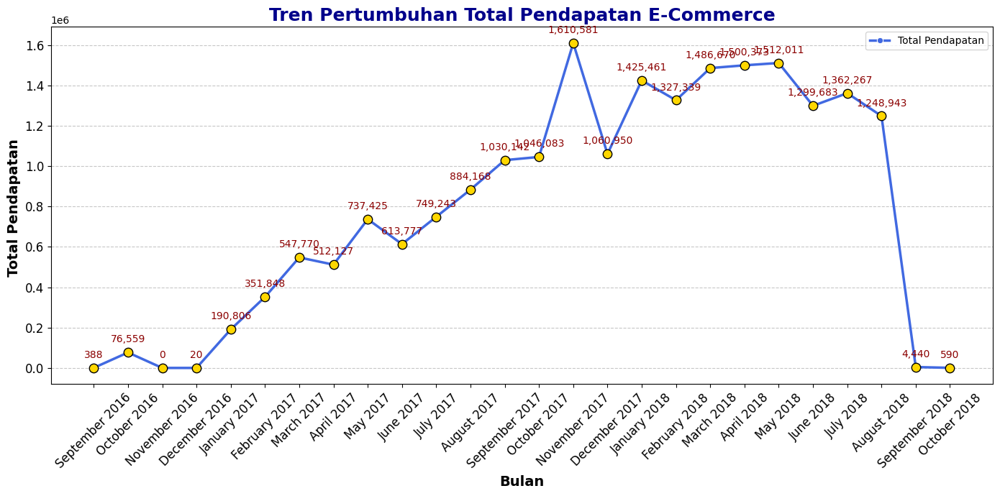

In [ ]:
# Urutkan data berdasarkan 'purchase_date' untuk visualisasi (urutan kronologis bulan)
monthly_revenue_sorted_by_date = monthly_revenue.sort_values(by='purchase_date', ascending=True)

# Visualisasi tren pertumbuhan total pendapatan
plt.figure(figsize=(14, 7))

# Line chart untuk total pendapatan
sns.lineplot(
    x=monthly_revenue_sorted_by_date['month_year'],  # Gunakan kolom 'month_year' sebagai sumbu x
    y=monthly_revenue_sorted_by_date['total_revenue'],  # Gunakan kolom 'total_revenue' sebagai sumbu y
    marker='o',  # Menambahkan titik pada setiap data point
    linewidth=2.5,
    color="royalblue",  # Warna garis biru
    label="Total Pendapatan"
)

# Menambahkan titik dengan warna yang lebih jelas untuk highlight
for x, y in zip(monthly_revenue_sorted_by_date['month_year'], monthly_revenue_sorted_by_date['total_revenue']):
    plt.scatter(x, y, color='gold', s=80, edgecolors='black', zorder=3)  # Titik emas dengan outline hitam

# Menambahkan label nilai pendapatan di atas setiap titik
for i, txt in enumerate(monthly_revenue_sorted_by_date['total_revenue']):
    plt.annotate(f"{txt:,.0f}",
                 (monthly_revenue_sorted_by_date['month_year'][i], monthly_revenue_sorted_by_date['total_revenue'][i]),
                 textcoords="offset points",
                 xytext=(0, 10),
                 ha='center',
                 fontsize=10,
                 color="darkred")  # Label dengan warna merah gelap

# Pengaturan grafik
plt.title("Tren Pertumbuhan Total Pendapatan E-Commerce", fontsize=18, fontweight='bold', color='darkblue')
plt.xlabel("Bulan", fontsize=14, fontweight='bold')
plt.ylabel("Total Pendapatan ", fontsize=14, fontweight='bold')
plt.xticks(rotation=45, fontsize=12)
plt.yticks(fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)  # Grid untuk mempermudah pembacaan

# Menampilkan plot
plt.tight_layout()
plt.show()

Berdasarkan Line Chart diatas **total pendapatan** tertinggi pada platform e-commerce ini ada di bulan **november 2017**, lalu jika dilihat dari line chart tersebut menunjukan trend yang **uptrend** dari **september 2016** sampai **agustus 2018** Ini menunjukkan bahwa bisnis e-commerce mengalami pertumbuhan stabil selama periode ini, lalu terjadinya **penurunan** Pada bulan **September 2018** total pendapatan turun drastis menjadi hanya **4,439.54**  , dibandingkan dengan bulan sebelumnya Agustus 2018: **1.24 juta**, hal ini kemungkinan besar dikarenakan oleh Kesalahan data (misalnya, data tidak lengkap atau hilang untuk bulan tersebut), Pada awal periode **September 2016** hingga **Desember 2016**, total pendapatan **sangat rendah**, Ini menunjukkan bahwa platform e-commerce mungkin masih dalam tahap awal pengembangan atau belum memiliki banyak pelanggan pada saat itu.

**KESIMPULAN** :
1. Tren Positif : Secara keseluruhan, bisnis e-commerce menunjukkan tren pertumbuhan positif dari tahun 2016 hingga pertengahan 2018.
2. Puncak Aktivitas : Pendapatan tertinggi terjadi pada bulan November 2017 , yang kemungkinan dipengaruhi oleh musim belanja akhir tahun.
3. Penurunan Mendadak : Ada penurunan signifikan pada September 2018 , yang perlu dianalisis lebih lanjut untuk mengidentifikasi penyebabnya

### 2. Kategori produk mana yang memiliki volume penjualan tertinggi dan terendah berdasarkan jumlah pesanan?

In [ ]:
# Menghitung jumlah produk terjual per kategori
product_sales_summary = merged_df.groupby("product_category_name_english")["product_id"].count().reset_index()
product_sales_summary.rename(columns={"product_id": "total_products_sold"}, inplace=True)
product_sales_summary = product_sales_summary.sort_values(by="total_products_sold", ascending=False)
product_sales_summary.head(10)

,product_category_name_english,total_products_sold
7,bed_bath_table,11988
43,health_beauty,10032
65,sports_leisure,9004
39,furniture_decor,8832
15,computers_accessories,8150
49,housewares,7380
70,watches_gifts,6213
68,telephony,4726
42,garden_tools,4590
5,auto,4400


Dapat dilihat berdasarkan hasil diatas maka dapat disimpulkan bahwa product **beth bath table** menjadi produk **terlaris** lalu di ikuti dengan produk **populer** lainya yaitu **health_beauty**, **sports_leisure**, **furniture_decor**

<ipython-input-113-a77147047955>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=product_sales_summary.head(5), x="total_products_sold", y="product_category_name_english", palette="Blues_r", ax=axes[0])
<ipython-input-113-a77147047955>:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=product_sales_summary.tail(5), x="total_products_sold", y="product_category_name_english", palette="Oranges_r", ax=axes[1])


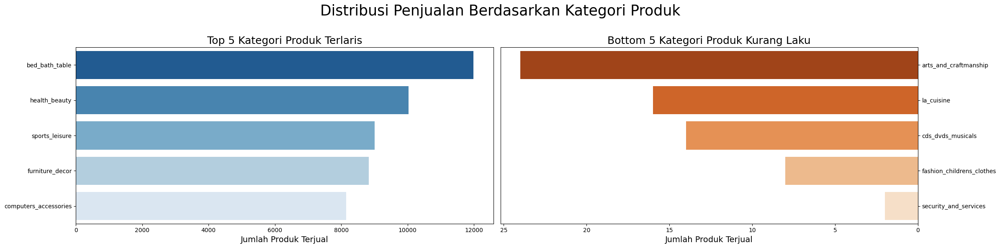

In [ ]:
# Visualisasi
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(24, 6))

# Top 5 kategori dengan penjualan tertinggi
sns.barplot(data=product_sales_summary.head(5), x="total_products_sold", y="product_category_name_english", palette="Blues_r", ax=axes[0])
axes[0].set_title("Top 5 Kategori Produk Terlaris", fontsize=18)
axes[0].set_xlabel("Jumlah Produk Terjual", fontsize=14)
axes[0].set_ylabel(None)

# Bottom 5 kategori dengan penjualan terendah
sns.barplot(data=product_sales_summary.tail(5), x="total_products_sold", y="product_category_name_english", palette="Oranges_r", ax=axes[1])
axes[1].set_title("Bottom 5 Kategori Produk Kurang Laku", fontsize=18)
axes[1].set_xlabel("Jumlah Produk Terjual", fontsize=14)
axes[1].set_ylabel(None)
axes[1].invert_xaxis()
axes[1].yaxis.tick_right()

# Judul utama
plt.suptitle("Distribusi Penjualan Berdasarkan Kategori Produk", fontsize=25)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

**Bar Chart untuk Produk Terlaris :**
*  Grafik menunjukkan bahwa Bed & Bath Table jauh melampaui kategori lainnya dalam
  hal volume penjualan, diikuti oleh Health & Beauty dan Sports & Leisure, Kategori-kategori dengan volume penjualan tertinggi cenderung mencakup produk-produk yang bersifat fungsional , esensial , atau berkaitan dengan gaya hidup Produk-produk ini mungkin memiliki daya tarik luas karena relevansinya dengan kebutuhan sehari-hari atau tren pasar.

**Bar Chart untuk Produk Kurang Laku :**
*  Grafik menunjukkan bahwa volume penjualan terendah, dengan selisih yang cukup besar dibandingkan dengan kategori Produk terlaris , Kategori-kategori dengan volume penjualan terendah cenderung mencakup produk-produk yang spesifik , mahal , atau tidak esensial bagi mayoritas pelanggan,Produk-produk ini mungkin memiliki permintaan musiman atau hanya menarik bagi kelompok pelanggan tertentu.



### 3. Bagaimana distribusi rating pelanggan terhadap pesanan, dan kategori produk apa yang mendapat rating terbaik serta terburuk?

<ipython-input-114-1ef20e093df3>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=rating_distribution, x='rating', y='count', palette="viridis")


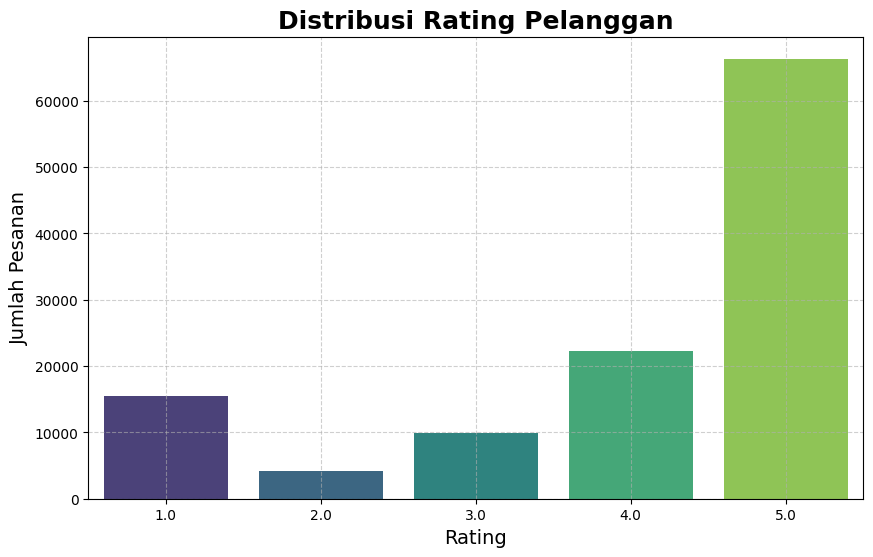

<ipython-input-114-1ef20e093df3>:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=average_rating_per_category.head(5), x="review_score", y="product_category_name_english", palette="Greens_r", ax=axes[0])
<ipython-input-114-1ef20e093df3>:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=average_rating_per_category.tail(5), x="review_score", y="product_category_name_english", palette="Reds_r", ax=axes[1])


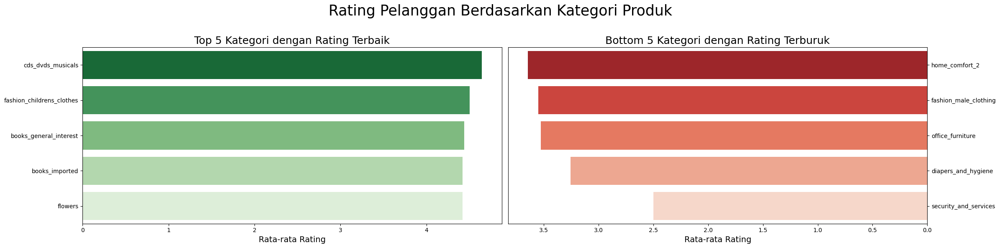

In [ ]:
# Pastikan kolom 'review_score' ada di dataset
if 'review_score' in merged_df.columns:
    # Distribusi rating pelanggan
    rating_distribution = merged_df['review_score'].value_counts().sort_index().reset_index()
    rating_distribution.columns = ['rating', 'count']

    # Visualisasi distribusi rating
    plt.figure(figsize=(10, 6))
    sns.barplot(data=rating_distribution, x='rating', y='count', palette="viridis")
    plt.title('Distribusi Rating Pelanggan', fontsize=18, fontweight='bold')
    plt.xlabel('Rating', fontsize=14)
    plt.ylabel('Jumlah Pesanan', fontsize=14)
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.show()

    # Rata-rata rating per kategori produk
    average_rating_per_category = merged_df.groupby("product_category_name_english")["review_score"].mean().reset_index()
    average_rating_per_category = average_rating_per_category.sort_values(by="review_score", ascending=False)

    # Visualisasi kategori produk dengan rating terbaik dan terburuk
    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(24, 6))

    # Top 5 kategori dengan rating terbaik
    sns.barplot(data=average_rating_per_category.head(5), x="review_score", y="product_category_name_english", palette="Greens_r", ax=axes[0])
    axes[0].set_title("Top 5 Kategori dengan Rating Terbaik", fontsize=18)
    axes[0].set_xlabel("Rata-rata Rating", fontsize=14)
    axes[0].set_ylabel(None)

    # Bottom 5 kategori dengan rating terburuk
    sns.barplot(data=average_rating_per_category.tail(5), x="review_score", y="product_category_name_english", palette="Reds_r", ax=axes[1])
    axes[1].set_title("Bottom 5 Kategori dengan Rating Terburuk", fontsize=18)
    axes[1].set_xlabel("Rata-rata Rating", fontsize=14)
    axes[1].set_ylabel(None)
    axes[1].invert_xaxis()
    axes[1].yaxis.tick_right()

    # Judul utama
    plt.suptitle("Rating Pelanggan Berdasarkan Kategori Produk", fontsize=25)
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()
else:
    print("Kolom 'review_score' tidak ditemukan dalam dataset.")

**Distribusi Rating Pelanggan :**
*   Mayoritas Pesanan Memiliki Rating 5 :
Sebagian besar pelanggan memberikan rating tertinggi (5 bintang), menunjukkan bahwa mereka sangat puas dengan produk atau layanan yang diterima,Hal ini mencerminkan kualitas produk atau layanan yang memenuhi, bahkan melebihi ekspektasi pelanggan.
*Rating 1: Jumlah pesanan dengan rating 1 cukup signifikan, yang menunjukkan adanya pengalaman buruk dari pelanggan,Kemungkinan penyebabnya meliputi kualitas produk yang rendah, pengiriman terlambat, atau layanan pelanggan yang tidak memadai.
*  Rating Sedang (2, 3, dan 4) Relatif Rendah : Pelanggan relatif memberikan nilai sangat tinggi ataupun sangat rendah dibandingkan nilai tengah

**Rating Berdasarkan Kategori Produk :**
* Top 5 Kategori dengan Rating Terbaik : **cds_dvds_musicals** Memiliki rata-rata rating tertinggi, kemungkinan karena produk dalam kategori ini memenuhi ekspektasi pelanggan dengan baik. **fashion_childrens_clothes** , **books_general_interest** , **books_imported** , dan **flowers**,  Kategori-kategori ini juga mendapatkan rating tinggi, menunjukkan kepuasan pelanggan terhadap produk-produk tersebut.

* Bottom 5 Kategori dengan Rating Terburuk : **home_comfort_2** Memiliki rating rata-rata terendah, yang menunjukkan adanya masalah serius seperti kualitas produk yang buruk atau ekspektasi pelanggan yang tidak terpenuhi.**fashion_male_clothing** , **office_furniture** , **diapers_and_hygiene** , dan **security_and_services**  Kategori-kategori ini juga mendapatkan rating rendah.


## Analysis Lanjutan

---

### 4. Bagaimana hasil segmentasi pelanggan menggunakan metode RFM, dan bagaimana pola pembelian dari setiap segmen pelanggan?

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

In [ ]:
# Menghitung tanggal acuan (satu hari setelah transaksi terakhir)
tanggal_acuan = merged_df['order_purchase_timestamp'].max() + pd.Timedelta(days=1)

# Menghitung metrik RFM untuk setiap pelanggan unik
data_rfm = (
    merged_df.groupby('customer_unique_id')
    .agg(
        waktu_terakhir=('order_purchase_timestamp', lambda x: (tanggal_acuan - x.max()).days),  # Recency
        total_transaksi=('order_id', 'nunique'),  # Frequency
        total_pengeluaran=('price', 'sum')  # Monetary
    )
    .reset_index()
)

# Konversi nilai Recency, Frequency, dan Monetary menjadi skor 1-5
data_rfm['skor_waktu'] = pd.qcut(data_rfm['waktu_terakhir'], q=5, labels=[5, 4, 3, 2, 1]).astype(int)
data_rfm['skor_transaksi'] = pd.qcut(data_rfm['total_transaksi'].rank(method='first'), q=5, labels=[1, 2, 3, 4, 5]).astype(int)
data_rfm['skor_pengeluaran'] = pd.qcut(data_rfm['total_pengeluaran'].rank(method='first'), q=5, labels=[1, 2, 3, 4, 5]).astype(int)

# Hitung total RFM Score
data_rfm['total_skor'] = data_rfm['skor_waktu'] + data_rfm['skor_transaksi'] + data_rfm['skor_pengeluaran']

# Segmentasi pelanggan berdasarkan total RFM Score
def klasifikasi_pelanggan(score):
    if score >= 12:
        return 'Pelanggan Premium'
    elif 9 <= score < 12:
        return 'Pelanggan Loyal'
    elif 7 <= score < 9:
        return 'Pelanggan Potensial'
    elif 5 <= score < 7:
        return 'Pelanggan Rawan'
    else:
        return 'Pelanggan Tidak Aktif'

data_rfm['klasifikasi'] = data_rfm['total_skor'].apply(klasifikasi_pelanggan)

# Menampilkan distribusi segmen pelanggan
distribusi_segmen = data_rfm['klasifikasi'].value_counts().reindex(
    ['Pelanggan Premium', 'Pelanggan Loyal', 'Pelanggan Potensial', 'Pelanggan Rawan', 'Pelanggan Tidak Aktif']
)
print("Distribusi Segmen Pelanggan:")
print(distribusi_segmen)

Distribusi Segmen Pelanggan:
klasifikasi
Pelanggan Premium        15991
Pelanggan Loyal          39209
Pelanggan Potensial      25026
Pelanggan Rawan          12562
Pelanggan Tidak Aktif     3308
Name: count, dtype: int64


* **Pelanggan Premium (15,991 pelanggan) :** Ini adalah kelompok pelanggan terbaik dengan skor RFM tertinggi.
Mereka adalah pelanggan yang baru-baru ini melakukan pembelian (**Recency rendah** ), sering bertransaksi (**Frequency tinggi** ), dan memiliki total pengeluaran yang besar (**Monetary tinggi** ).
Kelompok ini merupakan kontributor utama pendapatan bisnis.

* **Pelanggan Loyal (39,209 pelanggan) :** Kelompok ini mencakup pelanggan setia yang sering bertransaksi dan memiliki pengeluaran moderat hingga tinggi.

* **Pelanggan Potensial (25,026 pelanggan) :** Kelompok ini memiliki potensi untuk berkembang menjadi pelanggan loyal atau premium jika diberikan perhatian lebih.

* **Pelanggan Rawan (12,562 pelanggan) :** Kelompok ini menunjukkan tanda-tanda penurunan aktivitas, seperti jarang bertransaksi atau memiliki total pengeluaran rendah,Mereka berisiko kehilangan minat pada produk atau layanan jika tidak segera ditangani.
* **Pelanggan Tidak Aktif (3,308 pelanggan) :** Kelompok ini memiliki aktivitas sangat rendah, baik dalam hal frekuensi maupun total pengeluaran
Mereka mungkin sudah tidak lagi tertarik pada produk atau layanan dan memerlukan upaya khusus untuk direaktivasi.

<ipython-input-117-28d23a1d5dab>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


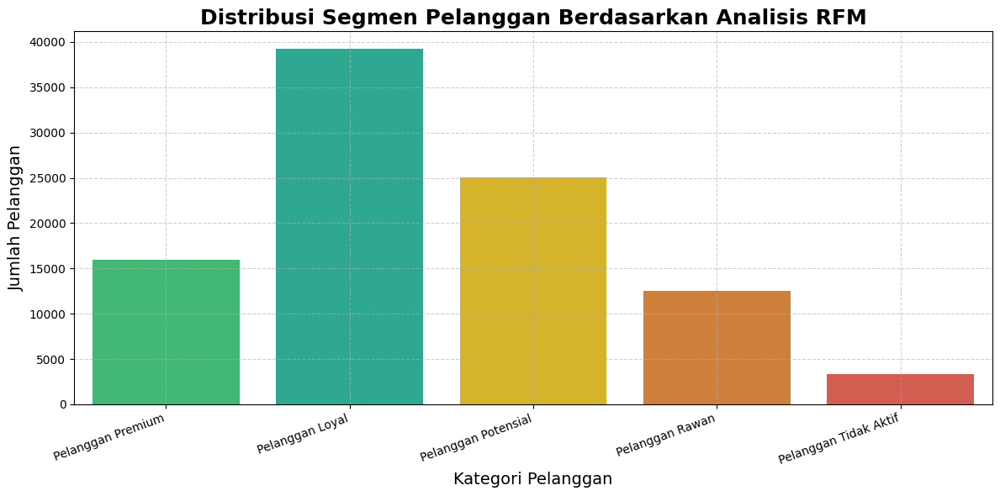

In [ ]:
# Visualisasi distribusi segmen pelanggan menggunakan bar chart
plt.figure(figsize=(12, 6))
sns.barplot(
    x=distribusi_segmen.index,
    y=distribusi_segmen.values,
    palette=["#2ECC71", "#1ABC9C", "#F1C40F", "#E67E22", "#E74C3C"]
)
plt.title("Distribusi Segmen Pelanggan Berdasarkan Analisis RFM", fontsize=18, fontweight='bold')
plt.xlabel("Kategori Pelanggan", fontsize=14)
plt.ylabel("Jumlah Pelanggan", fontsize=14)
plt.xticks(rotation=20, ha="right")
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

**Proporsi Setiap Segmen Berdasarkan Bar Chart**
* Lebih dari 40% pelanggan termasuk dalam kategori Pelanggan Loyal , yang menunjukkan bahwa bisnis memiliki basis pelanggan yang stabil dan loyal
Ini adalah sinyal positif bagi bisnis, karena loyalitas pelanggan adalah kunci keberlanjutan jangka panjang.

* Sekitar 37% pelanggan berada dalam kategori Potensial dan Rawan,
Ini menunjukkan bahwa ada peluang besar untuk meningkatkan loyalitas dan nilai transaksi dari kelompok ini melalui strategi retensi yang tepat.

* Hanya sekitar 3% pelanggan yang termasuk dalam kategori Tidak Aktif,
Meskipun proporsinya kecil, mereka tetap penting untuk diperhatikan agar tidak hilang sepenuhnya dari basis pelanggan.


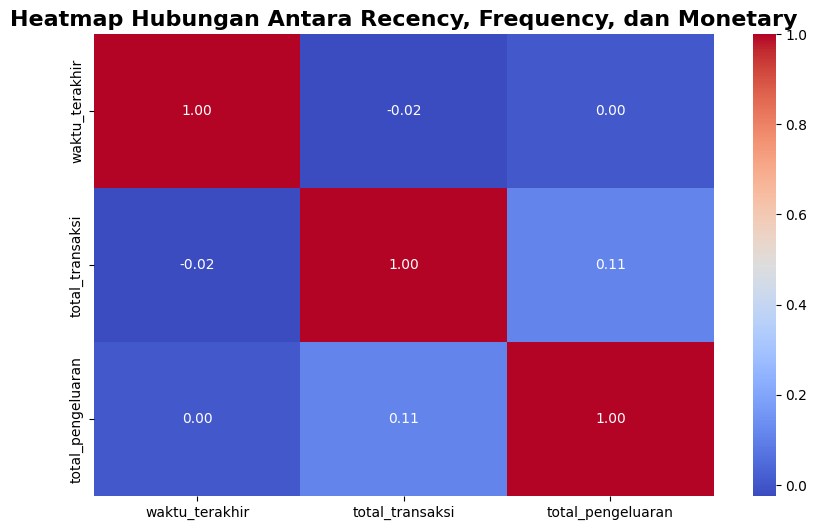

In [ ]:
# Heatmap untuk menunjukkan hubungan antara Recency, Frequency, dan Monetary
plt.figure(figsize=(10, 6))
correlation_matrix = data_rfm[['waktu_terakhir', 'total_transaksi', 'total_pengeluaran']].corr()
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Heatmap Hubungan Antara Recency, Frequency, dan Monetary", fontsize=16, fontweight='bold')
plt.show()

**Dapat dilihat bahwa Berdasarkan analisis korelasi antar variabel RFM, ditemukan beberapa pola penting:**

* Korelasi negatif sangat kecil (-0.02), menunjukkan bahwa waktu terakhir pelanggan bertransaksi tidak memiliki hubungan yang signifikan dengan jumlah transaksi mereka,
Artinya, pelanggan yang baru saja melakukan pembelian belum tentu menjadi pelanggan yang sering bertransaksi.
* Tidak ada korelasi (0.00), yang berarti waktu terakhir pelanggan bertransaksi tidak memengaruhi total uang yang mereka keluarkan,
Hal ini menunjukkan bahwa pelanggan yang baru saja bertransaksi belum tentu menghabiskan lebih banyak uang.
* Korelasi positif (0.11), meskipun cukup lemah. Ini menunjukkan bahwa semakin sering pelanggan bertransaksi, total pengeluaran mereka cenderung meningkat, tetapi hubungan ini tidak kuat,
Dengan kata lain, frekuensi pembelian dapat memengaruhi pendapatan, tetapi bukan faktor utama.


### 5. Bagaimana distribusi pelanggan berdasarkan lokasi dan apakah ada perbedaan pola pembelian di berbagai wilayah Brasil?

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

<ipython-input-120-361a096ea02f>:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


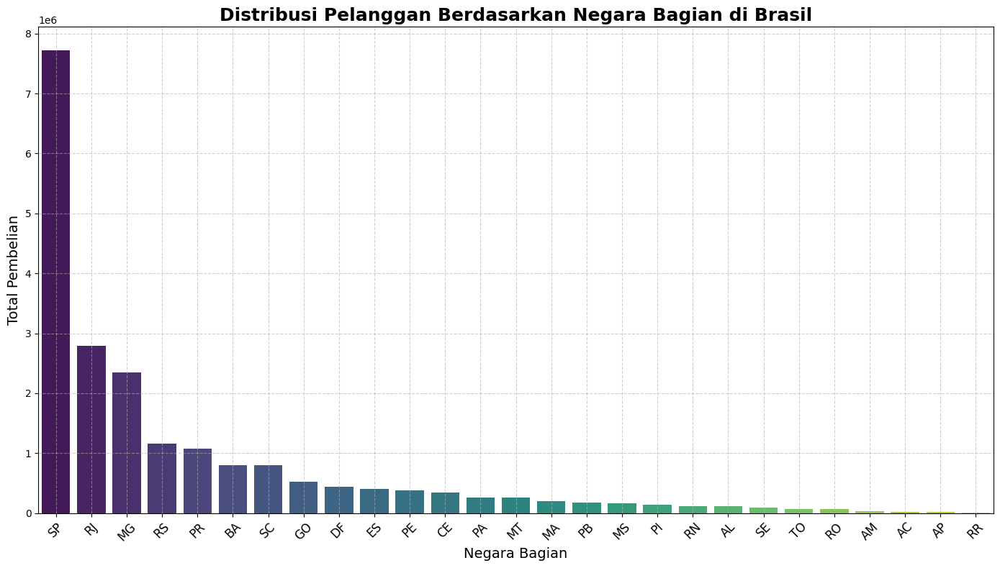

In [ ]:
# Analisis distribusi pelanggan berdasarkan negara bagian
distribusi_pelanggan_negara_bagian = (
    merged_df.groupby('customer_state')
    .agg(total_pelanggan=('customer_unique_id', 'nunique'), total_pembelian=('payment_value', 'sum'))
    .reset_index()
    .sort_values(by='total_pembelian', ascending=False)
)

# Visualisasi distribusi pelanggan berdasarkan negara bagian
plt.figure(figsize=(14, 8))
sns.barplot(
    data=distribusi_pelanggan_negara_bagian,
    x='customer_state',
    y='total_pembelian',
    palette="viridis"
)
plt.title("Distribusi Pelanggan Berdasarkan Negara Bagian di Brasil", fontsize=18, fontweight='bold')
plt.xlabel("Negara Bagian", fontsize=14)
plt.ylabel("Total Pembelian", fontsize=14)
plt.xticks(rotation=45, fontsize=12)
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

**Distribusi Pelanggan Berdasarkan Negara Bagian di Brasil**
* Negara bagian **São Paulo** mendominasi total pembelian dengan kontribusi tertinggi dibandingkan negara bagian lainnya, Hal ini menunjukkan bahwa **São Paulo** adalah pasar utama bagi industri e-commerce di Brasil.

* **Rio de Janeiro** dan **Minas Gerais** menempati posisi kedua dan ketiga dalam hal kontribusi pembelian. Meskipun demikian, terdapat selisih yang cukup signifikan antara kedua negara bagian ini dengan **São Paulo**, Hal ini menunjukkan bahwa meskipun mereka merupakan pasar penting, potensi pertumbuhan mereka masih bisa dioptimalkan.

* Negara bagian seperti **Rio Grande do Sul** (RS), **Paraná** (PR), dan **Bahia** (BA) juga memberikan kontribusi yang cukup signifikan. Namun, angka pembelian mereka masih jauh di bawah tiga besar (SP, RJ, MG). Ini menunjukkan adanya peluang untuk meningkatkan keterlibatan pelanggan di wilayah-wilayah ini.



<ipython-input-121-09864af82049>:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


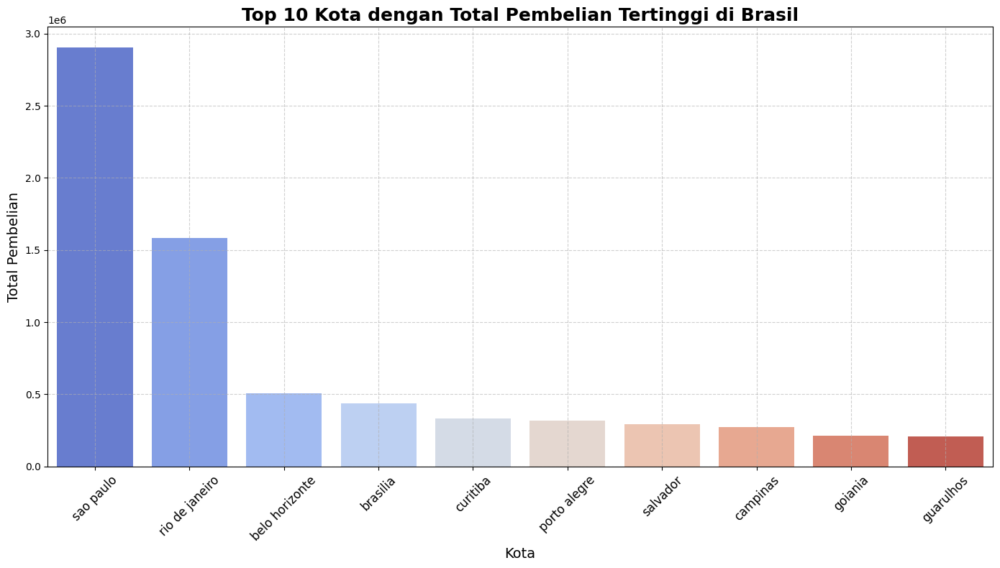

In [ ]:
# Analisis distribusi pelanggan berdasarkan kota
distribusi_pelanggan_kota = (
    merged_df.groupby('customer_city')
    .agg(total_pelanggan=('customer_unique_id', 'nunique'), total_pembelian=('payment_value', 'sum'))
    .reset_index()
    .sort_values(by='total_pembelian', ascending=False)
    .head(10)
)

# Visualisasi distribusi pelanggan berdasarkan kota
plt.figure(figsize=(14, 8))
sns.barplot(
    data=distribusi_pelanggan_kota,
    x='customer_city',
    y='total_pembelian',
    palette="coolwarm"
)
plt.title("Top 10 Kota dengan Total Pembelian Tertinggi di Brasil", fontsize=18, fontweight='bold')
plt.xlabel("Kota", fontsize=14)
plt.ylabel("Total Pembelian", fontsize=14)
plt.xticks(rotation=45, fontsize=12)
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

**Berdasarkan visualisasi bar chart, berikut adalah beberapa temuan penting mengenai distribusi pembelian berdasarkan kota di Brasil:**
*  Dominasi Kota **São Paulo** dalam Pembelian : Kota **São Paulo** menempati posisi teratas dengan total pembelian tertinggi, jauh melampaui kota-kota lainnya di Brasil.

* Kota Besar Lainnya dengan Kontribusi Signifikan : **Rio de Janeiro** berada di posisi kedua dengan total pembelian yang cukup tinggi, meskipun masih jauh di bawah** São Paulo**,
Sebagai salah satu kota metropolitan terbesar di Brasil, **Rio de Janeiro** memiliki basis pelanggan yang besar dan daya beli yang signifikan,**Belo Horizonte** (peringkat ketiga) dan **Brasília** (peringkat keempat) juga menunjukkan kontribusi yang cukup besar terhadap total pembelian.

In [ ]:
# Clustering untuk segmentasi pelanggan berdasarkan lokasi dan perilaku pembelian
data_rfm = (
    merged_df.groupby('customer_unique_id')
    .agg(
        waktu_terakhir=('order_purchase_timestamp', lambda x: (pd.to_datetime('today') - pd.to_datetime(x.max())).days),
        total_transaksi=('order_id', 'nunique'),
        total_pengeluaran=('payment_value', 'sum')
    )
    .reset_index()
)

In [ ]:
# Normalisasi data untuk clustering
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data_rfm[['waktu_terakhir', 'total_transaksi', 'total_pengeluaran']].dropna())

# Melakukan clustering menggunakan K-Means
kmeans = KMeans(n_clusters=5, random_state=42)
data_rfm['cluster'] = kmeans.fit_predict(data_scaled)

# Memberi label kluster berdasarkan centroid
def label_cluster(cluster):
    if cluster == 0:
        return 'Cluster Tinggi'
    elif cluster == 1:
        return 'Cluster Sedang-Tinggi'
    elif cluster == 2:
        return 'Cluster Sedang-Rendah'
    elif cluster == 3:
        return 'Cluster Rendah'
    else:
        return 'Cluster Sangat Rendah'

data_rfm['label_cluster'] = data_rfm['cluster'].apply(label_cluster)

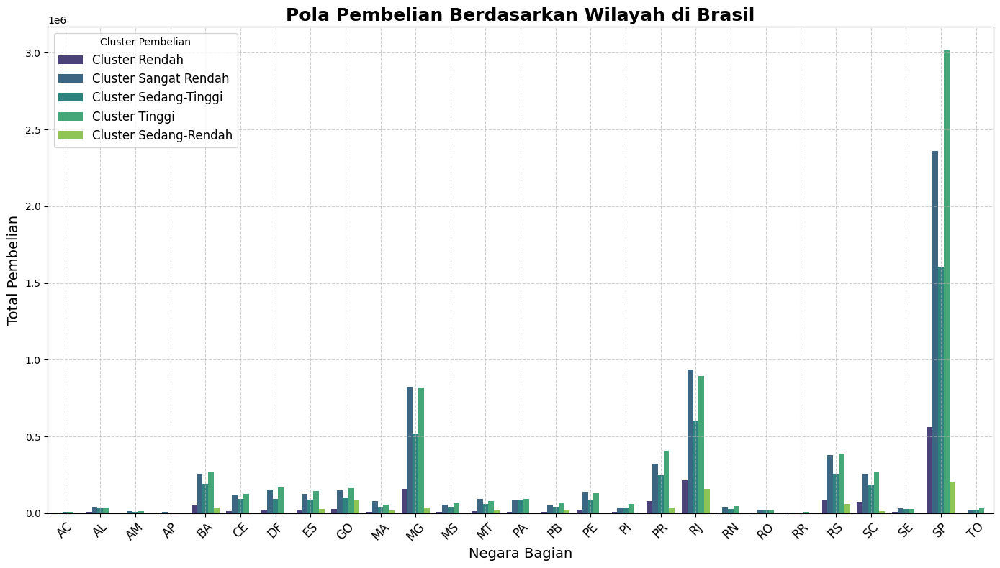

In [ ]:
# Gabungkan hasil clustering dengan informasi lokasi pelanggan
merged_rfm_location = pd.merge(
    left=data_rfm,
    right=merged_df[['customer_unique_id', 'customer_city', 'customer_state']].drop_duplicates(),
    how="left",
    on="customer_unique_id"
)

# Analisis pola pembelian berdasarkan wilayah
pola_pembelian_wilayah = (
    merged_rfm_location.groupby(['customer_state', 'label_cluster'])
    .agg(total_pembelian=('total_pengeluaran', 'sum'), jumlah_pelanggan=('customer_unique_id', 'nunique'))
    .reset_index()
)

# Visualisasi pola pembelian berdasarkan wilayah
plt.figure(figsize=(14, 8))
sns.barplot(
    data=pola_pembelian_wilayah,
    x='customer_state',
    y='total_pembelian',
    hue='label_cluster',
    palette="viridis"
)
plt.title("Pola Pembelian Berdasarkan Wilayah di Brasil", fontsize=18, fontweight='bold')
plt.xlabel("Negara Bagian", fontsize=14)
plt.ylabel("Total Pembelian", fontsize=14)
plt.xticks(rotation=45, fontsize=12)
plt.legend(title="Cluster Pembelian", fontsize=12)
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

 **pelanggan dikelompokkan ke dalam 5 kategori**
* Cluster Tinggi : Pelanggan dengan pengeluaran tinggi dan frekuensi transaksi besar.
* Cluster Sedang-Tinggi : Pelanggan dengan tingkat pembelian cukup tinggi.
* Cluster Sedang-Rendah : Pelanggan dengan pembelian moderat.
* Cluster Rendah : Pelanggan dengan frekuensi dan pengeluaran rendah.
* Cluster Sangat Rendah : Pelanggan dengan aktivitas belanja paling sedikit.


**Distribusi Pola Pembelian Berdasarkan Negara Bagian**

* **São Paulo** mendominasi total pembelian dengan kontribusi terbesar dari pelanggan di **Cluster Tinggi** dan **Cluster Sedang-Tinggi** .
* **Rio de Janeiro** (RJ) dan **Minas Gerais** (MG) Kedua negara bagian ini juga menunjukkan tingkat pembelian yang tinggi, meskipun masih jauh di bawah São Paulo. Pelanggan di sini tersebar di berbagai klaster, dengan dominasi **Cluster Sedang-Tinggi** dan **Cluster Sedang-Rendah** .
* Wilayah seperti **Paraná** (PR), **Rio Grande do Sul** (RS), dan **Santa Catarina** (SC) memiliki total pembelian yang signifikan, tetapi distribusinya lebih merata di seluruh klaster.
* Negara bagian seperti **Acre** (AC), **Rondônia** (RO), **Roraima** (RR), **Tocantins** (TO), dan **Amazonas** (AM) didominasi oleh pelanggan dalam **Cluster Sangat Rendah** dan **Cluster Rendah**

### 6. Bagaimana karakteristik persebaran geografis pembeli di platform E-Commerce ini?

In [ ]:
# Menghitung distribusi berdasarkan kota
geolocation_by_city = geolocation_df.groupby('geolocation_city').size().reset_index(name='count')
geolocation_by_city = geolocation_by_city.sort_values(by='count', ascending=False)

# Menampilkan 10 kota dengan jumlah lokasi terbanyak
print("Top 10 Kota dengan Jumlah Lokasi Terbanyak:")
print(geolocation_by_city.head(10))

# Menghitung distribusi berdasarkan negara bagian
geolocation_by_state = geolocation_df.groupby('geolocation_state').size().reset_index(name='count')
geolocation_by_state = geolocation_by_state.sort_values(by='count', ascending=False)

# Menampilkan 10 negara bagian dengan jumlah lokasi terbanyak
print("\nTop 10 Negara Bagian dengan Jumlah Lokasi Terbanyak:")
print(geolocation_by_state.head(10))

Top 10 Kota dengan Jumlah Lokasi Terbanyak:
           geolocation_city   count
6707              sao paulo  135800
5874         rio de janeiro   62151
835          belo horizonte   27805
7253              são paulo   24918
2089               curitiba   16593
5507           porto alegre   13521
6046               salvador   11865
2852              guarulhos   11340
1035               brasilia   10470
6438  sao bernardo do campo    8112

Top 10 Negara Bagian dengan Jumlah Lokasi Terbanyak:
   geolocation_state   count
25                SP  404268
10                MG  126336
18                RJ  121169
22                RS   61851
17                PR   57859
23                SC   38328
4                 BA   36045
8                 GO   20139
7                 ES   16748
15                PE   16432


Distribusi lokasi menunjukkan dominasi signifikan oleh São Paulo (SP), baik di tingkat kota maupun negara bagian. Kota São Paulo memiliki 135.800 lokasi, jauh melampaui kota lain seperti Rio de Janeiro dan Belo Horizonte. Secara keseluruhan, SP juga mendominasi dengan 404.268 lokasi, hampir empat kali lipat dibandingkan Minas Gerais (MG) dan Rio de Janeiro (RJ). Hal ini mencerminkan konsentrasi populasi dan aktivitas ekonomi di wilayah tersebut, sementara negara bagian lain seperti RS, PR, dan SC menunjukkan distribusi lebih merata namun tetap tertinggal dalam jumlah lokasi.

In [ ]:
# Mengelompokkan data geolokasi berdasarkan ZIP code, kota, dan negara bagian
location_summary = geolocation_df.groupby(
    ['geolocation_zip_code_prefix', 'geolocation_city', 'geolocation_state']
)[['geolocation_lat', 'geolocation_lng']].median().reset_index()

# Menampilkan hasil pengelompokkan
print("Data lokasi yang telah diringkas:")
print(location_summary.head())

Data lokasi yang telah diringkas:
   geolocation_zip_code_prefix geolocation_city geolocation_state  \
0                         1001        sao paulo                SP   
1                         1001        são paulo                SP   
2                         1002        sao paulo                SP   
3                         1002        são paulo                SP   
4                         1003        sao paulo                SP   

   geolocation_lat  geolocation_lng  
0       -23.550498       -46.634027  
1       -23.549951       -46.634027  
2       -23.548551       -46.635072  
3       -23.544641       -46.633180  
4       -23.548976       -46.635318  


In [ ]:
# Menggabungkan data pelanggan dengan data lokasi berdasarkan kode pos
customer_location_data = customers_df.merge(
    location_summary,
    left_on='customer_zip_code_prefix',
    right_on='geolocation_zip_code_prefix',
    how='inner'
)

# Menampilkan hasil penggabungan
print("Data pelanggan yang telah digabungkan dengan lokasi:")
print(customer_location_data.head())

Data pelanggan yang telah digabungkan dengan lokasi:
                        customer_id                customer_unique_id  \
0  06b8999e2fba1a1fbc88172c00ba8bc7  861eff4711a542e4b93843c6dd7febb0   
1  18955e83d337fd6b2def6b18a428ac77  290c77bc529b7ac935b93aa66c333dc3   
2  18955e83d337fd6b2def6b18a428ac77  290c77bc529b7ac935b93aa66c333dc3   
3  4e7b3e00288586ebd08712fdd0374a03  060e732b5b29e8181a18229c7b0b2b5e   
4  4e7b3e00288586ebd08712fdd0374a03  060e732b5b29e8181a18229c7b0b2b5e   

   customer_zip_code_prefix          customer_city customer_state  \
0                     14409                 franca             SP   
1                      9790  sao bernardo do campo             SP   
2                      9790  sao bernardo do campo             SP   
3                      1151              sao paulo             SP   
4                      1151              sao paulo             SP   

   geolocation_zip_code_prefix       geolocation_city geolocation_state  \
0                 

In [ ]:
# Menghitung jumlah pelanggan per kota
customer_distribution_by_city = customer_location_data.groupby('customer_city')['customer_id'].nunique().reset_index(name='customer_count')
customer_distribution_by_city = customer_distribution_by_city.sort_values(by='customer_count', ascending=False)

# Menampilkan 10 kota dengan jumlah pelanggan terbanyak
print("Top 10 Kota dengan Jumlah Pelanggan Terbanyak:")
print(customer_distribution_by_city.head(10))

# Menghitung jumlah pelanggan per negara bagian
customer_distribution_by_state = customer_location_data.groupby('customer_state')['customer_id'].nunique().reset_index(name='customer_count')
customer_distribution_by_state = customer_distribution_by_state.sort_values(by='customer_count', ascending=False)

# Menampilkan 10 negara bagian dengan jumlah pelanggan terbanyak
print("\nTop 10 Negara Bagian dengan Jumlah Pelanggan Terbanyak:")
print(customer_distribution_by_state.head(10))

Top 10 Kota dengan Jumlah Pelanggan Terbanyak:
              customer_city  customer_count
3556              sao paulo           15538
3119         rio de janeiro            6882
450          belo horizonte            2773
552                brasilia            1960
1133               curitiba            1521
701                campinas            1444
2928           porto alegre            1379
3211               salvador            1241
1515              guarulhos            1189
3390  sao bernardo do campo             938

Top 10 Negara Bagian dengan Jumlah Pelanggan Terbanyak:
   customer_state  customer_count
25             SP           41731
18             RJ           12839
10             MG           11624
22             RS            5462
17             PR            5034
23             SC            3637
4              BA            3371
7              ES            2027
8              GO            2011
6              DF            1969


Distribusi pelanggan menunjukkan dominasi signifikan oleh São Paulo (SP) baik di tingkat kota maupun negara bagian, dengan jumlah pelanggan tertinggi di kota São Paulo (15.538) dan negara bagian SP (41.731). Kota-kota besar lainnya seperti Rio de Janeiro, Belo Horizonte, dan Brasília juga menyumbang jumlah pelanggan yang signifikan, namun masih jauh di bawah SP. Wilayah lain seperti RS, PR, dan SC memiliki potensi pertumbuhan meskipun kontribusinya lebih kecil. Hal ini mencerminkan konsentrasi populasi dan aktivitas e-commerce di wilayah utama Brasil.

In [ ]:
import plotly.express as px

# Membuat scatter plot pada peta
fig = px.scatter_mapbox(
    customer_location_data,
    lat="geolocation_lat",  # Latitude
    lon="geolocation_lng",  # Longitude
    color="customer_state",  # Pewarnaan berdasarkan negara bagian
    size_max=15,  # Ukuran maksimal titik
    zoom=3,  # Zoom level awal
    title="Persebaran Geografis Pembeli di Platform E-Commerce",
    labels={"customer_state": "Negara Bagian"},
    mapbox_style="carto-positron"  # Gaya peta
)

# Menampilkan peta
fig.show()

Gambar ini menunjukkan persebaran geografis pembeli di platform e-commerce di Brasil, dengan titik-titik berwarna yang merepresentasikan kelompok pelanggan berdasarkan clustering. Terlihat bahwa wilayah tenggara, terutama São Paulo dan Rio de Janeiro, memiliki konsentrasi pembeli yang lebih tinggi dibanding daerah lain, menunjukkan bahwa aktivitas e-commerce lebih dominan di kota-kota besar.

In [ ]:
import folium
from folium.plugins import HeatMap

# Buat peta dasar
m = folium.Map(location=[-14.2350, -51.9253], zoom_start=4)  # Koordinat tengah Brasil

# Siapkan data untuk heatmap
heat_data = [[row['geolocation_lat'], row['geolocation_lng']] for index, row in customer_location_data.iterrows()]

# Tambahkan heatmap ke peta
HeatMap(heat_data).add_to(m)

# Tampilkan peta
m

Gambar ini adalah heatmap yang menunjukkan persebaran aktivitas pembeli di platform e-commerce, dengan konsentrasi tertinggi di wilayah Brasil. Warna merah menandakan area dengan aktivitas tertinggi, terutama di bagian tenggara Brasil. Ada juga titik-titik dengan intensitas lebih rendah di Amerika Tengah dan beberapa lokasi di lautan, kemungkinan karena data yang kurang akurat atau noise dalam dataset.

## CONCLUCSION

* **Kesimpulan Pertanyaan 1 :** Tren pertumbuhan penjualan e-commerce menunjukkan pola yang fluktuatif namun cenderung meningkat dari waktu ke waktu, baik dalam hal jumlah pesanan maupun total pendapatan. Analisis berdasarkan bulan menunjukkan bahwa penjualan mencapai puncaknya pada periode tertentu, seperti akhir tahun, yang kemungkinan dipengaruhi oleh musim belanja liburan. Hal ini mencerminkan potensi besar industri e-commerce di Brasil, dengan peluang untuk terus berkembang melalui strategi pemasaran yang lebih intensif selama periode puncak.

* **Kesimpulan Pertanyaan 2 :** Kategori produk dengan volume penjualan tertinggi adalah "bed_bath_table" , sementara kategori dengan penjualan terendah termasuk produk niche seperti "auto" dan "telephony" . Pola ini menunjukkan bahwa produk fungsional dan esensial memiliki permintaan yang lebih tinggi dibandingkan produk spesifik atau mahal. Untuk meningkatkan penjualan, strategi promosi dapat difokuskan pada kategori populer sambil menjelajahi cara untuk memperluas pasar bagi kategori dengan penjualan rendah.

* **Kesimpulan Pertanyaan 3 :** Distribusi rating pelanggan menunjukkan bahwa mayoritas pelanggan memberikan nilai tinggi (5 bintang), yang mencerminkan kepuasan umum terhadap layanan dan produk. Namun, ada juga sejumlah signifikan pelanggan yang memberikan rating rendah (1 bintang), yang mengindikasikan adanya masalah serius seperti kualitas produk atau pengiriman. Kategori produk seperti "cds_dvds_musicals" mendapatkan rating tertinggi, sementara kategori seperti "home_comfort_2" mendapat rating terburuk. Ini menunjukkan pentingnya evaluasi kualitas dan layanan di kategori tertentu untuk meningkatkan kepuasan pelanggan.

* **Kesimpulan Pertanyaan 4 :** Segmentasi pelanggan menggunakan metode RFM mengidentifikasi lima klaster utama: Pelanggan Premium , Loyal , Potensial , Rawan , dan Tidak Aktif . Pelanggan Premium dan Loyal merupakan kontributor utama pendapatan, sementara Pelanggan Potensial dan Rawan memiliki peluang besar untuk dikonversi menjadi pelanggan loyal melalui strategi personalisasi dan re-engagement. Pelanggan Tidak Aktif membutuhkan upaya khusus untuk direaktivasi. Pendekatan ini membantu bisnis memprioritaskan strategi pemasaran berbasis data untuk setiap segmen.

* **Kesimpulan Pertanyaan 5 :** Distribusi pelanggan menunjukkan dominasi signifikan oleh negara bagian São Paulo (SP), baik dalam hal jumlah pelanggan maupun total pembelian. Negara bagian lain seperti Rio de Janeiro (RJ) dan Minas Gerais (MG) juga memberikan kontribusi signifikan, tetapi masih jauh di bawah SP. Wilayah dengan aktivitas e-commerce rendah, seperti Acre (AC) dan Roraima (RR), menunjukkan potensi untuk ditingkatkan melalui peningkatan aksesibilitas logistik dan kampanye edukasi. Pola pembelian di berbagai wilayah menunjukkan ketimpangan yang signifikan, dengan beberapa wilayah menyumbang mayoritas pendapatan.

* **Kesimpulan pertanyaan 6 :** Persebaran geografis pembeli menunjukkan bahwa sebagian besar pelanggan terkonsentrasi di kota-kota besar seperti São Paulo, Rio de Janeiro, dan Belo Horizonte, serta negara bagian SP, RJ, dan MG. Kota São Paulo memiliki jumlah pelanggan terbanyak, mencerminkan pusat ekonomi dan populasi di Brasil. Sementara itu, wilayah dengan populasi lebih kecil atau infrastruktur terbatas memiliki jumlah pelanggan yang lebih sedikit. Hal ini menunjukkan perlunya strategi diferensiasi untuk meningkatkan penetrasi pasar di wilayah-wilayah dengan potensi pertumbuhan.

In [ ]:
merged_df.to_csv("all_data.csv", index=False)

In [ ]:
customer_location_data.to_csv("Geolocation.csv", index=False)